In [ ]:
#needed dependencies for io in Drive
!pip install -U -q PyDrive
!pip install h5py
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from google.colab import drive
drive.mount('/content/drive')
!ls "/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
all_models_detailed_results.json	    all_models_simplified_results.json
all_models_last_checkpoint_detailed.json    StrictFigs.ipynb
all_models_last_checkpoint_simplified.json


In [ ]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Helper to extract numeric checkpoint step
def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

# Load your JSON data
with open("/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_simplified_results.json", "r") as f:
    data = json.load(f)

# List of metrics to visualize (will be extracted from first model/checkpoint)
def extract_metrics(model_data):
    for ckpt_data in model_data.values():
        return list(ckpt_data.keys())

# Plotting
for model_name, checkpoints in data.items():
    metrics = extract_metrics(checkpoints)

    for metric in metrics:
        values = []
        x_labels = []

        for ckpt, ckpt_metrics in checkpoints.items():
            if metric in ckpt_metrics:
                x_labels.append(ckpt)
                values.append((ckpt, ckpt_metrics[metric]))

        # Sort by numeric checkpoint size
        values.sort(key=lambda x: get_ckpt_number(x[0]))
        x_labels_sorted, y_values = zip(*values)

        # Plot
        plt.figure(figsize=(10, 6))
        sns.lineplot(x=x_labels_sorted, y=y_values, marker='o')
        plt.xticks(rotation=45)
        plt.title(f"{model_name} - {metric}")
        plt.xlabel("Checkpoint")
        plt.ylabel("Score")
        plt.tight_layout()
        plt.grid(True)
        plt.savefig(f"{model_name}_{metric}.png")  # save each plot as an image
        plt.close()


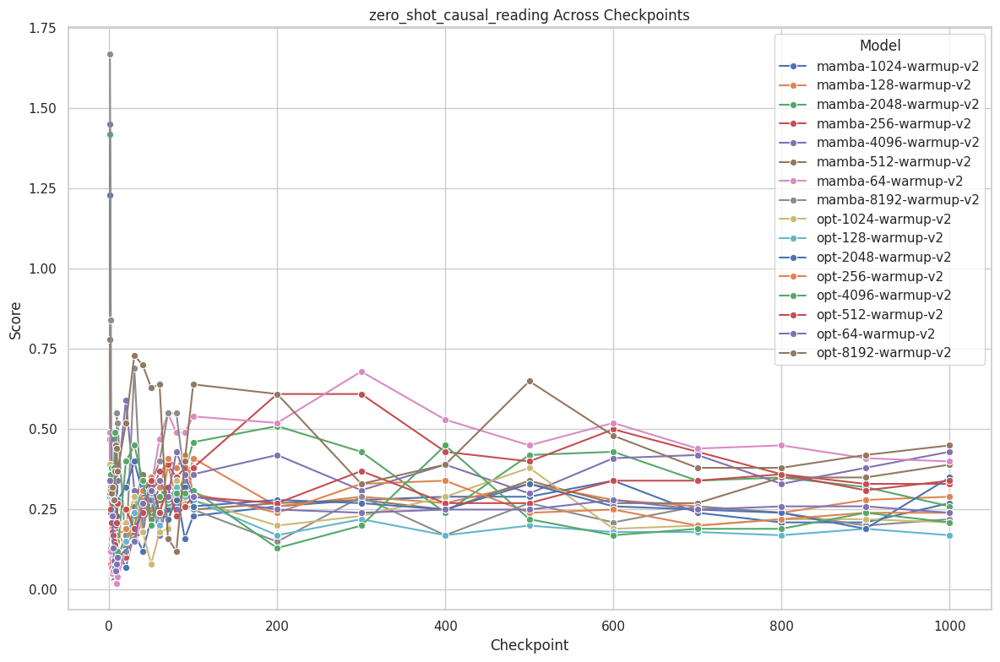

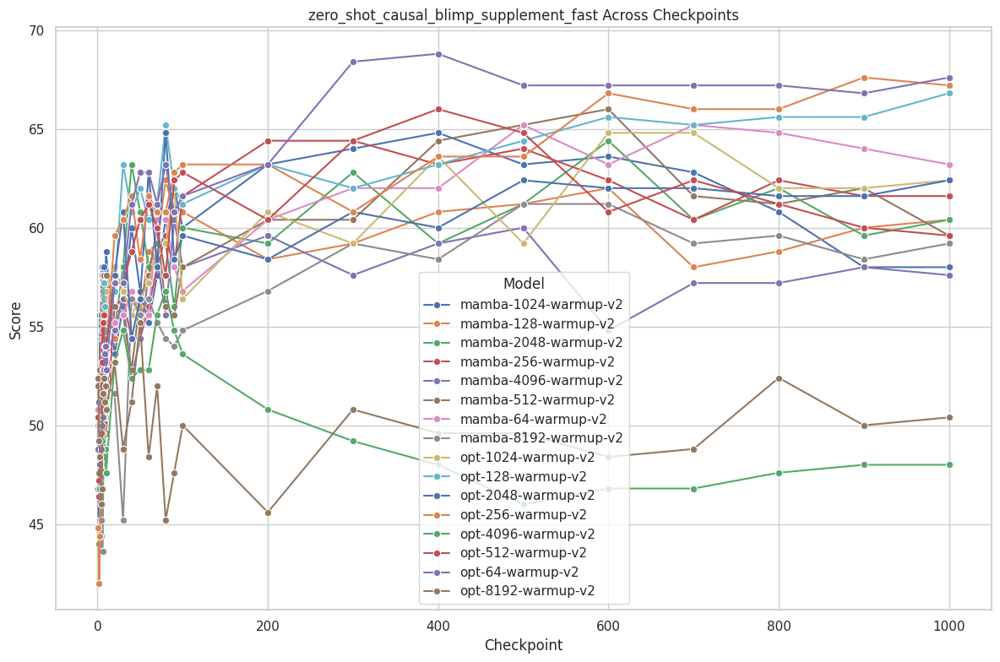

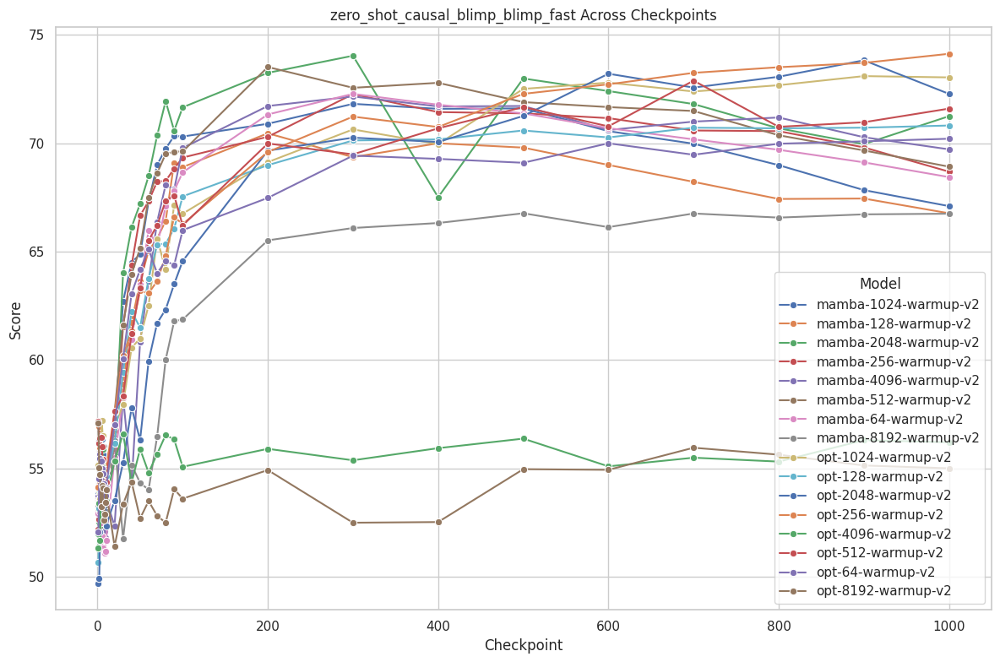

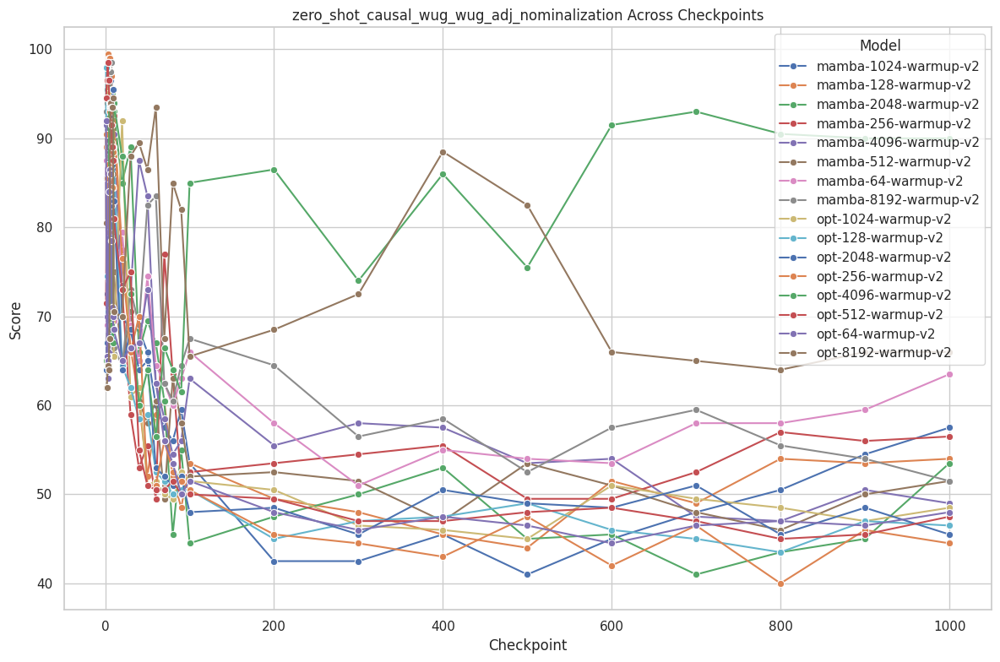

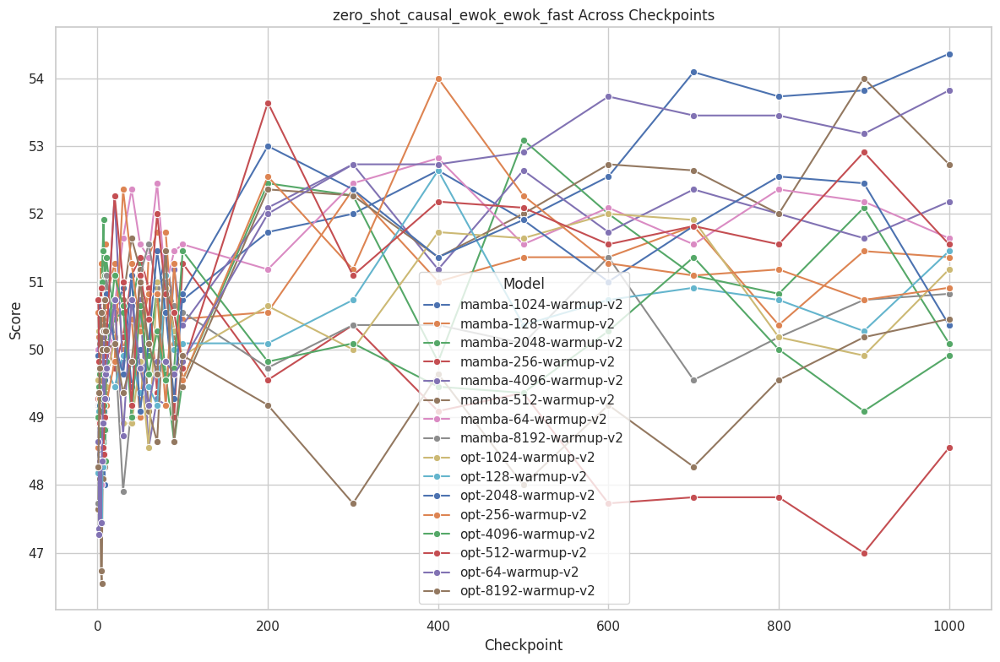

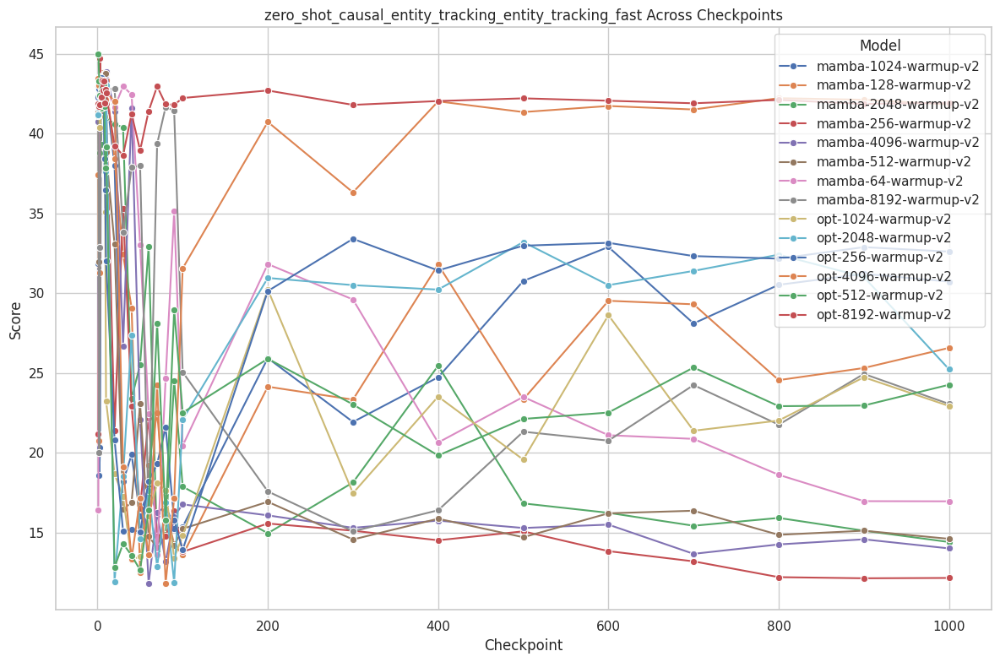

In [ ]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Helper to extract numeric checkpoint step
def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

# Load your JSON data
with open("/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_simplified_results.json", "r") as f:
    data = json.load(f)

# Metrics you want to plot
target_metrics = [
    "zero_shot_causal_reading",
    "zero_shot_causal_blimp_supplement_fast",
    "zero_shot_causal_blimp_blimp_fast",
    "zero_shot_causal_wug_wug_adj_nominalization",
    "zero_shot_causal_ewok_ewok_fast",
    "zero_shot_causal_entity_tracking_entity_tracking_fast",
]

sns.set(style="whitegrid")

# Plot each metric separately
for metric in target_metrics:
    plt.figure(figsize=(12, 8))

    for model_name, checkpoints in data.items():
        values = []

        for ckpt, ckpt_metrics in checkpoints.items():
            if metric in ckpt_metrics:
                values.append((get_ckpt_number(ckpt), ckpt_metrics[metric]))

        if values:
            values.sort(key=lambda x: x[0])
            x_vals, y_vals = zip(*values)
            sns.lineplot(x=x_vals, y=y_vals, marker='o', label=model_name)

    plt.title(f"{metric} Across Checkpoints")
    plt.xlabel("Checkpoint")
    plt.ylabel("Score")
    plt.legend(title="Model")
    plt.tight_layout()
    plt.grid(True)
    # Clean filename from metric string
    safe_metric_name = metric.replace("/", "_").replace(":", "_")
    plt.savefig(f"{safe_metric_name}_across_models.png")
    plt.show()



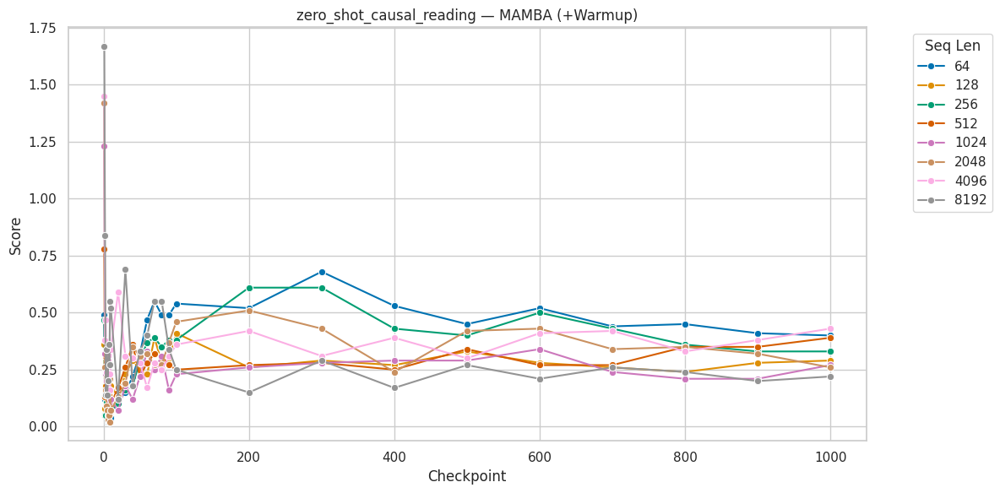

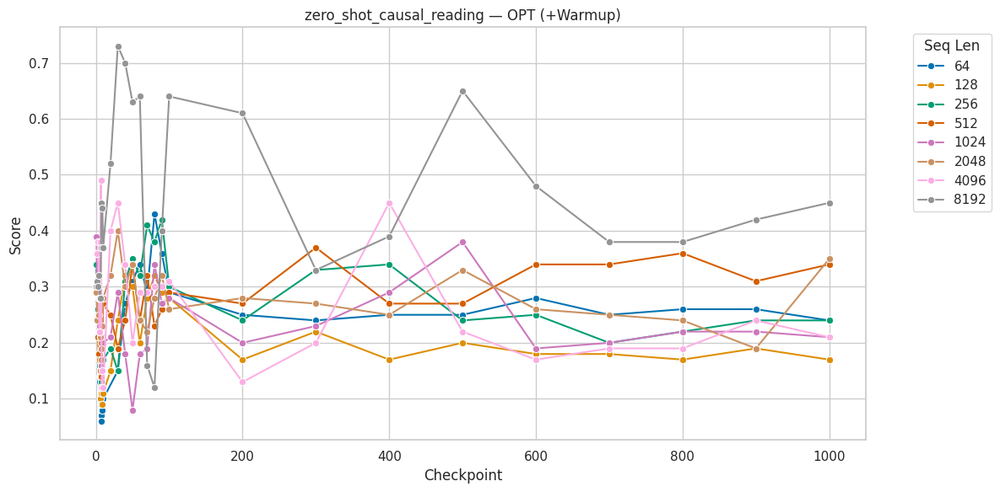

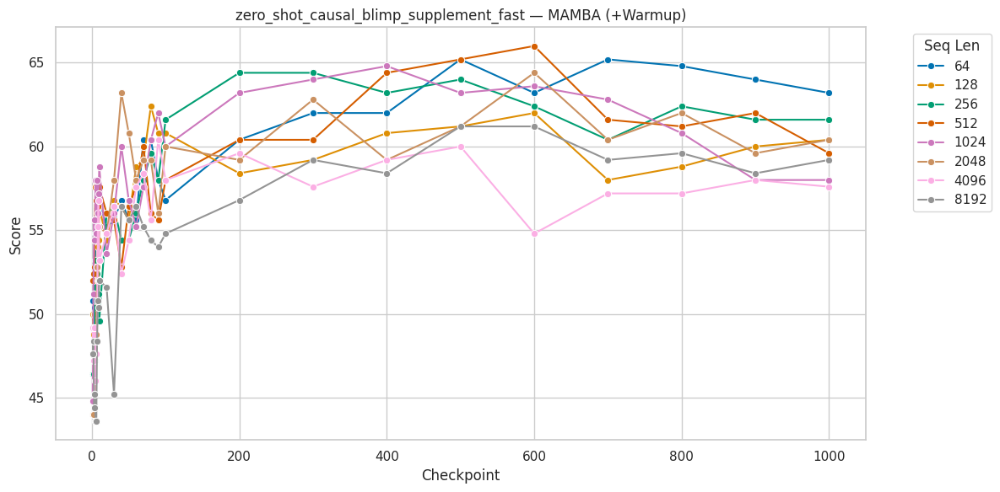

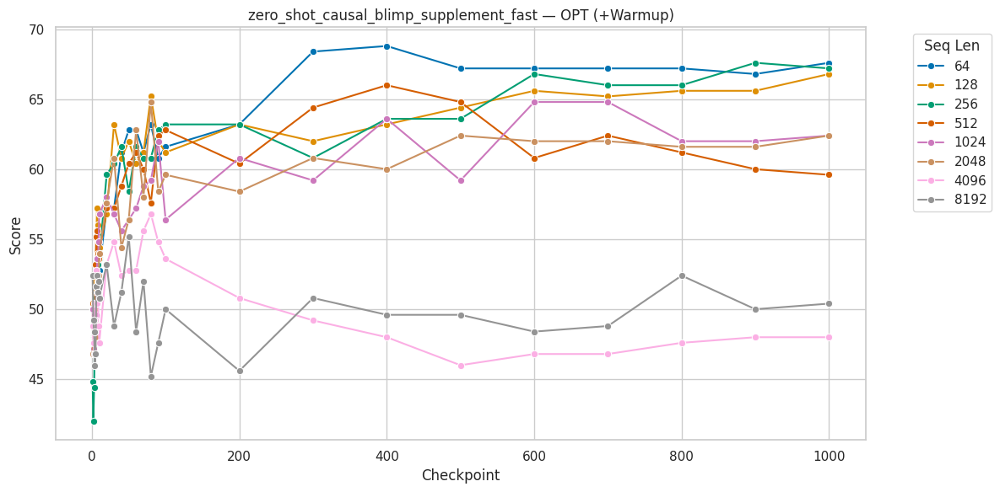

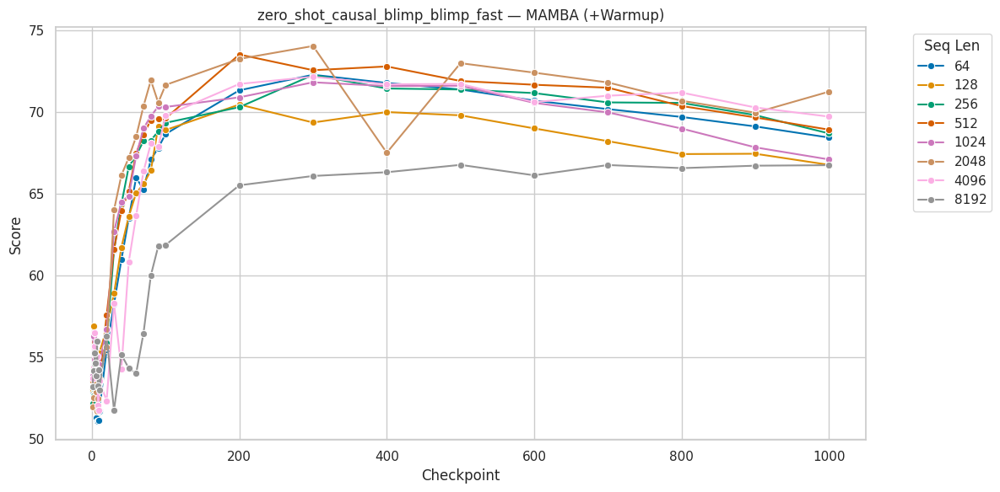

...

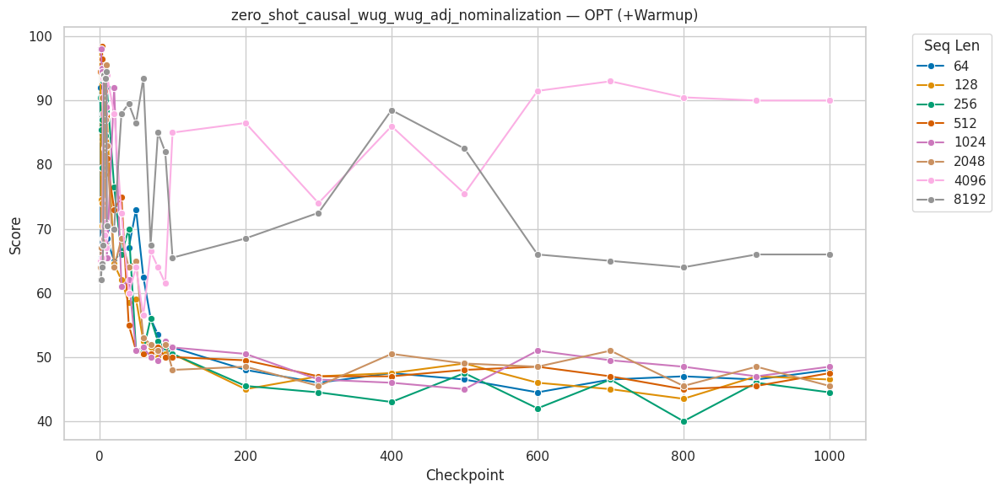

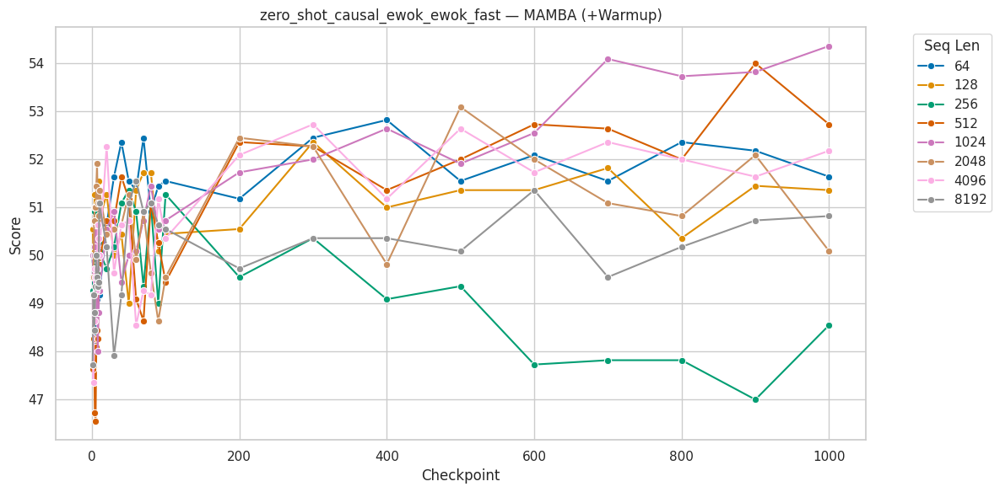

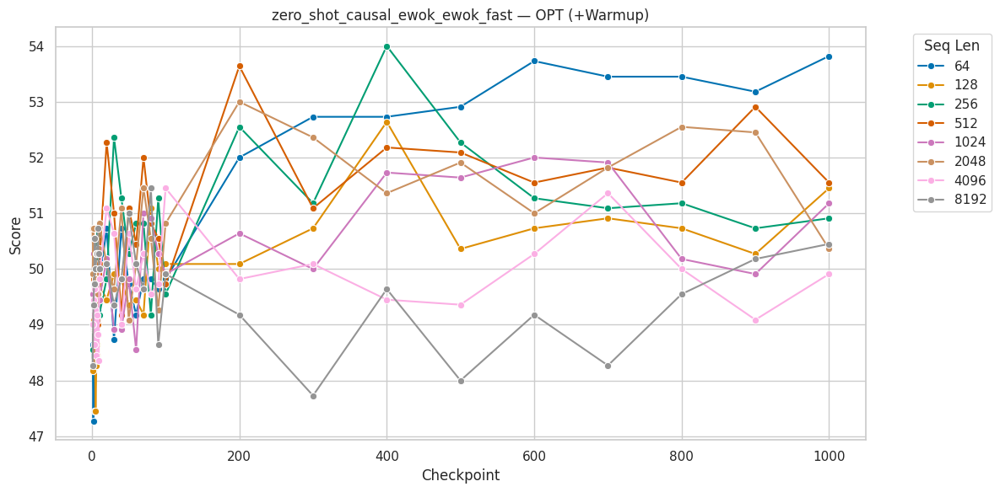

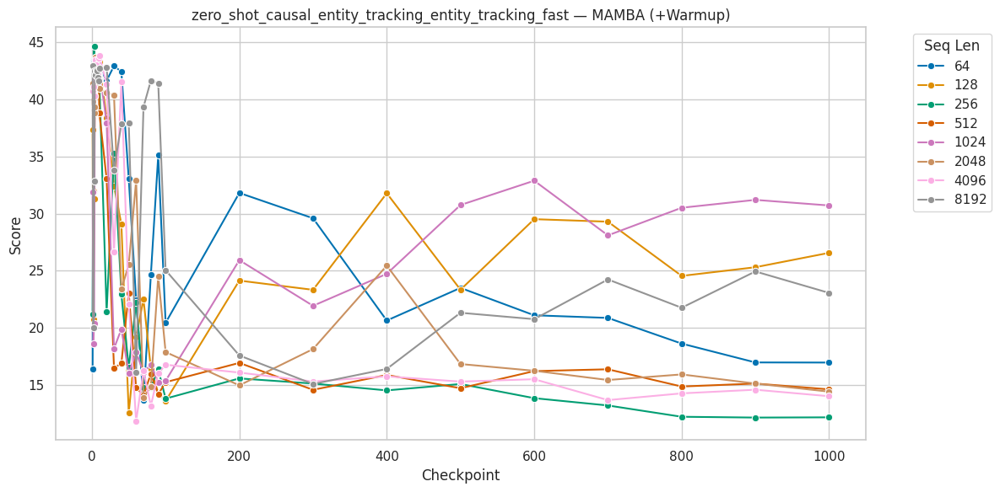

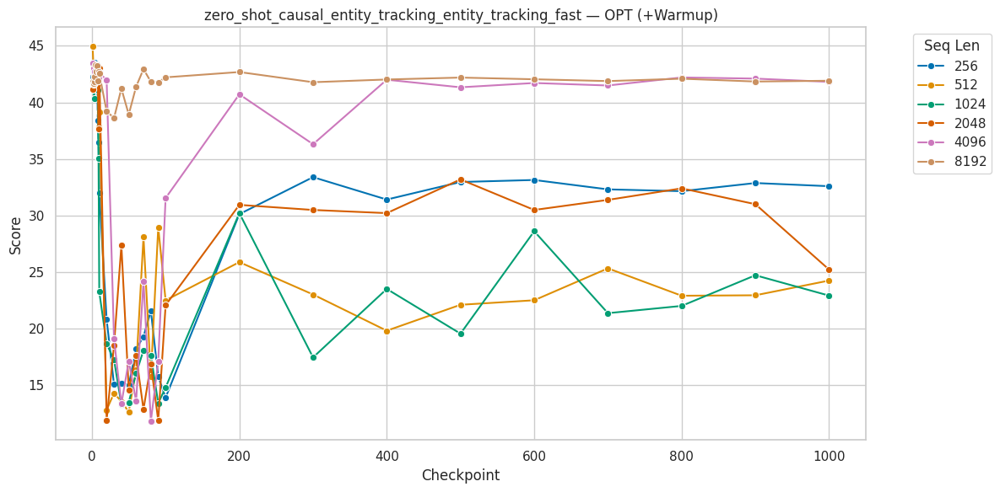

In [ ]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Extract numeric checkpoint
def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

# Extract model components
def parse_model_name(name):
    """
    Parse model name like: 'mamba-1024-warmup-v2' or 'opt-512'
    Returns (model_type, warmup, seq_len)
    """
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Load JSON data
with open("/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_simplified_results.json", "r") as f:
    data = json.load(f)

# Target metrics
target_metrics = [
    "zero_shot_causal_reading",
    "zero_shot_causal_blimp_supplement_fast",
    "zero_shot_causal_blimp_blimp_fast",
    "zero_shot_causal_wug_wug_adj_nominalization",
    "zero_shot_causal_ewok_ewok_fast",
    "zero_shot_causal_entity_tracking_entity_tracking_fast",
]

sns.set(style="whitegrid", palette="colorblind")

# Plot each metric separately for mamba and opt (only warmup=+)
for metric in target_metrics:
    for model_type in ["mamba", "opt"]:
        plt.figure(figsize=(12, 6))

        # Collect models by seq_len for consistent ordering
        seq_len_to_values = {}

        for model_name, checkpoints in data.items():
            parsed_type, parsed_warmup, seq_len = parse_model_name(model_name)
            if parsed_type == model_type and parsed_warmup == "+":
                values = []
                for ckpt, ckpt_metrics in checkpoints.items():
                    if metric in ckpt_metrics:
                        values.append((get_ckpt_number(ckpt), ckpt_metrics[metric]))
                if values:
                    values.sort()
                    seq_len_to_values[seq_len] = values

        # Sort by seq_len
        for seq_len in sorted(seq_len_to_values.keys()):
            values = seq_len_to_values[seq_len]
            x_vals, y_vals = zip(*values)
            sns.lineplot(x=x_vals, y=y_vals, marker='o', label=f"{seq_len}")

        plt.title(f"{metric} — {model_type.upper()} (+Warmup)")
        plt.xlabel("Checkpoint")
        plt.ylabel("Score")
        plt.legend(title="Seq Len", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.tight_layout()

        # Save
        safe_metric = metric.replace("/", "_").replace(":", "_")
        plt.savefig(f"{safe_metric}_{model_type}_warmup_only_by_seq_len.png")
        plt.show()


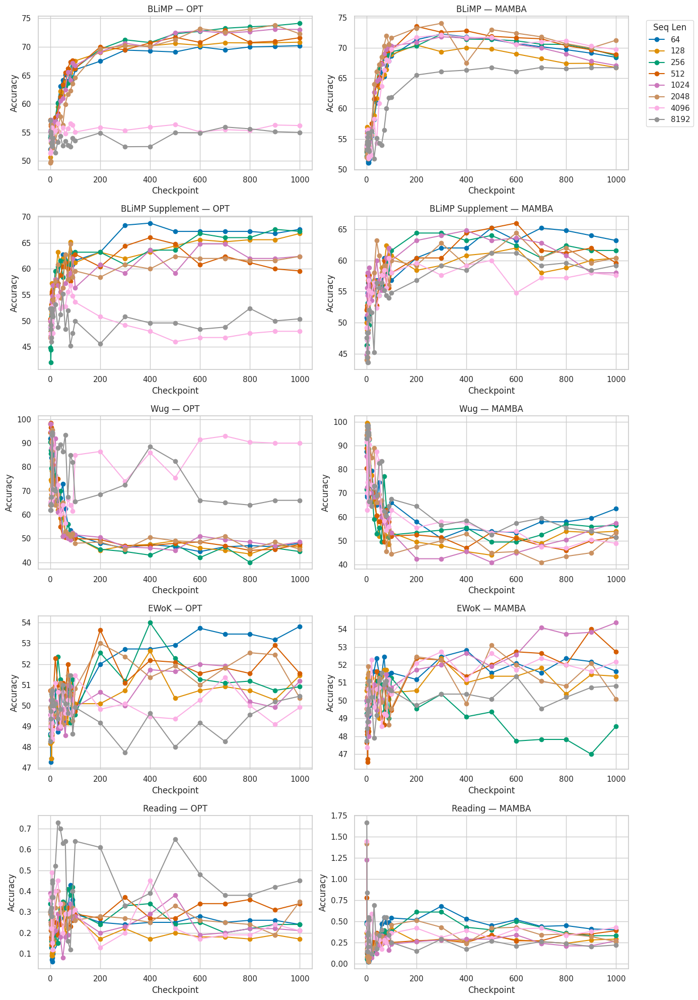

In [ ]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Load JSON data
with open("/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_simplified_results.json", "r") as f:
    data = json.load(f)

# Helper functions
def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Task order and label mapping
metric_mapping = {
    "zero_shot_causal_blimp_blimp_fast": "BLiMP",
    "zero_shot_causal_blimp_supplement_fast": "BLiMP Supplement",
    "zero_shot_causal_wug_wug_adj_nominalization": "Wug",
    "zero_shot_causal_ewok_ewok_fast": "EWoK",
    "zero_shot_causal_reading": "Reading",
}

task_keys = list(metric_mapping.keys())
task_labels = list(metric_mapping.values())
model_types = ["opt", "mamba"]
model_labels = {"opt": "OPT", "mamba": "MAMBA"}

# Prepare seaborn
sns.set(style="whitegrid", palette="colorblind")

# Create subplots: 5 rows (tasks) × 2 cols (models)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 20), sharex=False)
fig.subplots_adjust(hspace=0.4, wspace=0.2)

for row_idx, (metric, task_label) in enumerate(zip(task_keys, task_labels)):
    for col_idx, model_type in enumerate(model_types):
        ax = axes[row_idx][col_idx]

        # Gather data: {seq_len: [(ckpt, score), ...]}
        seq_len_to_vals = {}

        for model_name, checkpoints in data.items():
            parsed_type, warmup, seq_len = parse_model_name(model_name)
            if parsed_type != model_type or warmup != "+":
                continue
            if seq_len is None:
                continue

            values = []
            for ckpt_name, ckpt_metrics in checkpoints.items():
                if metric in ckpt_metrics:
                    values.append((get_ckpt_number(ckpt_name), ckpt_metrics[metric]))
            if values:
                values.sort()
                seq_len_to_vals.setdefault(seq_len, []).append(values)

        # Plot each sequence length
        for seq_len in sorted(seq_len_to_vals.keys()):
            # Average across multiple models with same seq_len
            all_ckpts = {}
            for run in seq_len_to_vals[seq_len]:
                for step, val in run:
                    all_ckpts.setdefault(step, []).append(val)
            x_vals = sorted(all_ckpts.keys())
            y_vals = [sum(all_ckpts[step]) / len(all_ckpts[step]) for step in x_vals]

            ax.plot(x_vals, y_vals, marker='o', label=f"{seq_len}")

        ax.set_title(f"{task_label} — {model_labels[model_type]}")
        ax.set_xlabel("Checkpoint")
        ax.set_ylabel("Accuracy")
        ax.grid(True)
        if row_idx == 0 and col_idx == 1:
            ax.legend(title="Seq Len", bbox_to_anchor=(1.05, 1), loc="upper left")

# Save to single PNG
plt.tight_layout()
plt.savefig("subplots_by_task_and_model.png", dpi=300)
plt.show()


# Fine-Tuned Results

In [ ]:
# Load JSON
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_simplified.json', 'r') as f:
    data = json.load(f)

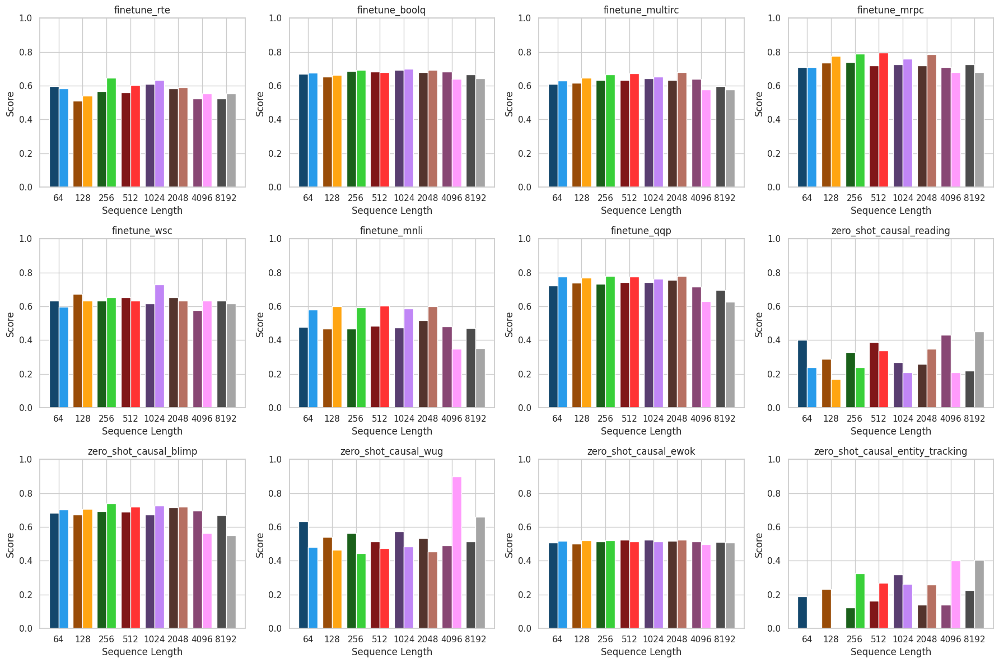

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Tasks with percentage scores that need to be divided by 100
percentage_tasks = {
    "zero_shot_causal_blimp",
    "zero_shot_causal_wug",
    "zero_shot_causal_ewok",
    "zero_shot_causal_entity_tracking"
}

# Load JSON
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_simplified.json', 'r') as f:
    data = json.load(f)

rows = []
for ckpt_name, scores in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for dataset, score in scores.items():
        # Convert percentages to decimals for specific datasets
        if dataset in percentage_tasks:
            score = score / 100.0
        rows.append({
            'model': model_type.capitalize(),
            'warmup': warmup,
            'seq_len': seq_len,
            'dataset': dataset,
            'score': score
        })

df = pd.DataFrame(rows)

seq_order = sorted(df['seq_len'].unique())

base_cmap = plt.get_cmap('tab10')
colors = [base_cmap(i % base_cmap.N) for i in range(len(seq_order))]

def shade_color(color, factor=0.7):
    c = np.array(color[:3])
    c = np.clip(c * factor, 0, 1)
    return (*c, color[3] if len(color) > 3 else 1.0)

datasets = df['dataset'].unique()
n_datasets = len(datasets)
fig, axes = plt.subplots(nrows=(n_datasets + 2)//4, ncols=4, figsize=(18, 4*((n_datasets + 2)//4)))
axes = axes.flatten()

for i, dataset in enumerate(datasets):
    ax = axes[i]
    data = df[df['dataset'] == dataset]

    width = 0.4
    x = np.arange(len(seq_order))

    for j, seq_len in enumerate(seq_order):
        subset = data[data['seq_len'] == seq_len]
        mamba_score = subset[subset['model'] == 'Mamba']['score'].values
        opt_score = subset[subset['model'] == 'Opt']['score'].values

        mamba_score = mamba_score[0] if len(mamba_score) > 0 else 0
        opt_score = opt_score[0] if len(opt_score) > 0 else 0

        color = colors[j]
        mamba_color = shade_color(color, factor=0.6)
        opt_color = shade_color(color, factor=1.3)

        ax.bar(x[j] - width/2, mamba_score, width=width, color=mamba_color)
        ax.bar(x[j] + width/2, opt_score, width=width, color=opt_color)

    ax.set_xticks(x)
    ax.set_xticklabels(seq_order)
    ax.set_ylim(0, 1)
    ax.set_xlabel('Sequence Length')
    ax.set_ylabel('Score')
    ax.set_title(dataset)

for ax in axes[n_datasets:]:
    ax.axis('off')

plt.tight_layout()
plt.savefig("finetune_all.png", dpi=300)
plt.show()



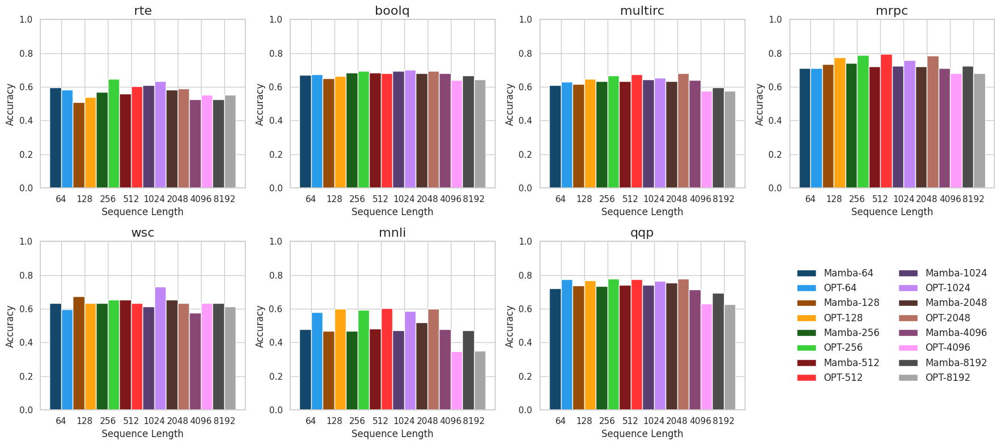

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Tasks with percentage scores that need to be divided by 100
percentage_tasks = {
    "zero_shot_causal_blimp",
    "zero_shot_causal_wug",
    "zero_shot_causal_ewok",
    "zero_shot_causal_entity_tracking"
}

# Load JSON
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_simplified.json', 'r') as f:
    data = json.load(f)

rows = []
for ckpt_name, scores in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for dataset, score in scores.items():
        if not dataset.startswith("finetune_"):
            continue
        # Convert percentages to decimals for specific datasets
        if dataset in percentage_tasks:
            score = score / 100.0
        rows.append({
            'model': model_type.capitalize(),
            'warmup': warmup,
            'seq_len': seq_len,
            'dataset': dataset,
            'score': score
        })

df = pd.DataFrame(rows)

seq_order = sorted(df['seq_len'].unique())

base_cmap = plt.get_cmap('tab10')
colors = [base_cmap(i % base_cmap.N) for i in range(len(seq_order))]

def shade_color(color, factor=0.7):
    c = np.array(color[:3])
    c = np.clip(c * factor, 0, 1)
    return (*c, color[3] if len(color) > 3 else 1.0)

datasets = df['dataset'].unique()
n_datasets = len(datasets)
fig, axes = plt.subplots(nrows=(n_datasets + 2)//4, ncols=4, figsize=(18, 4*((n_datasets + 2)//4)))
axes = axes.flatten()

for i, dataset in enumerate(datasets):
    ax = axes[i]
    data = df[df['dataset'] == dataset]

    width = 0.5
    x = np.arange(len(seq_order))

    for j, seq_len in enumerate(seq_order):
        subset = data[data['seq_len'] == seq_len]
        mamba_score = subset[subset['model'] == 'Mamba']['score'].values
        opt_score = subset[subset['model'] == 'Opt']['score'].values

        mamba_score = mamba_score[0] if len(mamba_score) > 0 else 0
        opt_score = opt_score[0] if len(opt_score) > 0 else 0

        color = colors[j]
        mamba_color = shade_color(color, factor=0.6)
        opt_color = shade_color(color, factor=1.3)

        ax.bar(x[j] - width/2, mamba_score, width=width, color=mamba_color)
        ax.bar(x[j] + width/2, opt_score, width=width, color=opt_color)

    ax.set_xticks(x)
    ax.set_xticklabels(seq_order)
    ax.set_ylim(0, 1)
    ax.set_xlabel('Sequence Length')
    ax.set_ylabel('Accuracy')
    ax.set_title(dataset.replace("finetune_", ""), fontsize=16)

# Turn off unused axes
for ax in axes[n_datasets:]:
    ax.axis('off')

# Use the last available (unused) subplot for legend
legend_ax = axes[-1]
legend_ax.axis('off')

# Create legend entries
legend_elements = []
for j, seq_len in enumerate(seq_order):
    color = colors[j]
    mamba_color = shade_color(color, factor=0.6)
    opt_color = shade_color(color, factor=1.3)

    legend_elements.append(Patch(facecolor=mamba_color, label=f'Mamba-{seq_len}'))
    legend_elements.append(Patch(facecolor=opt_color, label=f'OPT-{seq_len}'))

# Add the legend
legend_ax.legend(handles=legend_elements, loc='center', ncol=2, fontsize=12, frameon=False)
#legend_ax.set_title("Colour Code", fontsize=14)

plt.tight_layout()
plt.savefig("finetune_tasks.png", dpi=300)
plt.show()


# Detailed Subtasks

F1 and MCC for FineTune

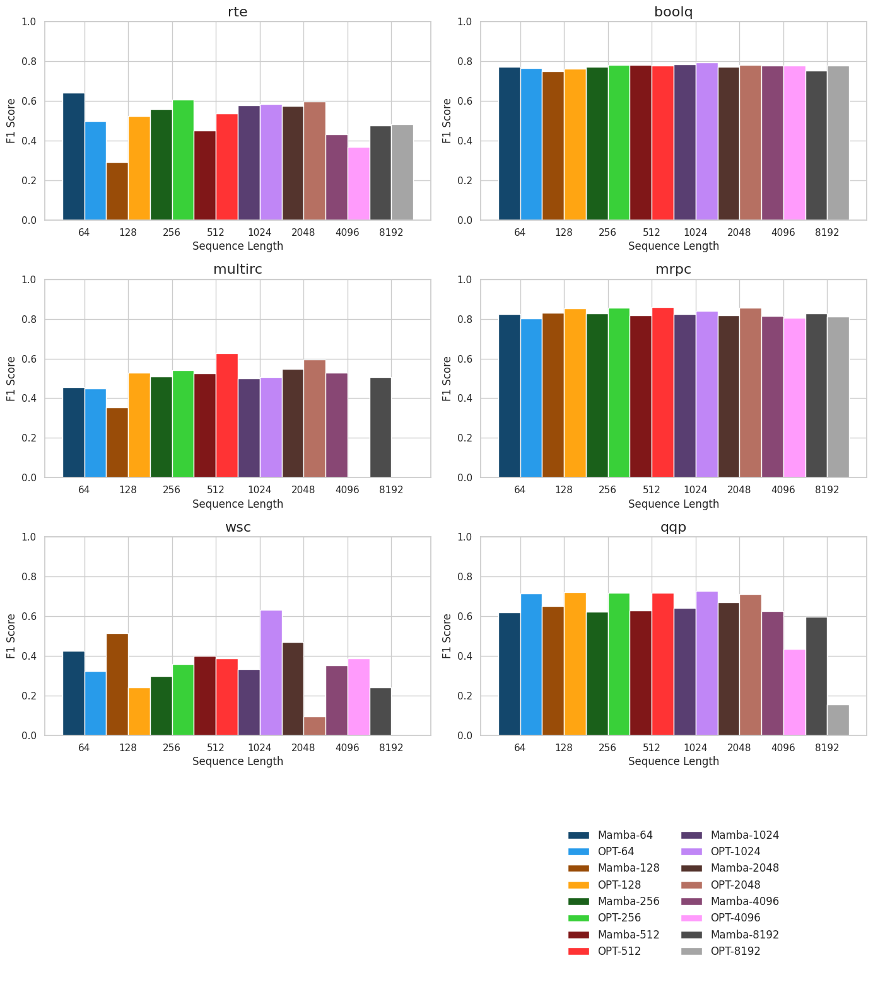

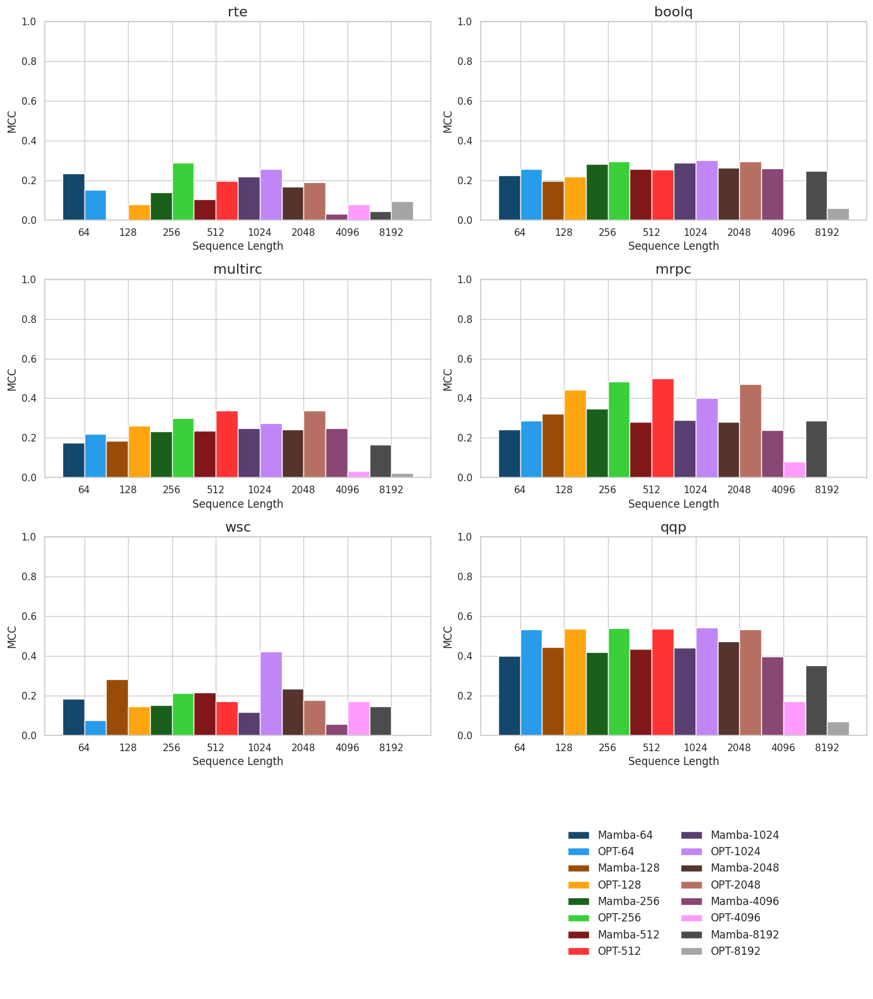

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Load JSON with detailed metrics
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# Prepare structured rows for F1 and MCC
rows_f1, rows_mcc = [], []

for ckpt_name, model_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    finetune_tasks = [k for k in model_data if k.startswith("finetune")]
    for task in finetune_tasks:
        scores = model_data[task]
        f1 = scores.get('f1', None)
        mcc = scores.get('mcc', None)

        if f1 is not None:
            rows_f1.append({
                'model': model_type.capitalize(),
                'warmup': warmup,
                'seq_len': seq_len,
                'dataset': task,
                'score': f1
            })
        if mcc is not None:
            rows_mcc.append({
                'model': model_type.capitalize(),
                'warmup': warmup,
                'seq_len': seq_len,
                'dataset': task,
                'score': mcc
            })

# Convert to DataFrames
df_f1 = pd.DataFrame(rows_f1)
df_mcc = pd.DataFrame(rows_mcc)

# Helper: plotting function
def plot_metric_grid(df, metric_name, output_file):
    seq_order = sorted(df['seq_len'].unique())
    base_cmap = plt.get_cmap('tab10')
    colors = [base_cmap(i % base_cmap.N) for i in range(len(seq_order))]

    def shade_color(color, factor=0.7):
        c = np.array(color[:3])
        c = np.clip(c * factor, 0, 1)
        return (*c, color[3] if len(color) > 3 else 1.0)

    datasets = df['dataset'].unique()
    n_datasets = len(datasets)
    fig, axes = plt.subplots(nrows=(n_datasets + 2)//2, ncols=2, figsize=(14, 4*((n_datasets + 2)//2)))
    axes = axes.flatten()

    for i, dataset in enumerate(datasets):
        ax = axes[i]
        data = df[df['dataset'] == dataset]

        width = 0.5
        x = np.arange(len(seq_order))

        for j, seq_len in enumerate(seq_order):
            subset = data[data['seq_len'] == seq_len]
            mamba_score = subset[subset['model'] == 'Mamba']['score'].values
            opt_score = subset[subset['model'] == 'Opt']['score'].values

            mamba_score = mamba_score[0] if len(mamba_score) > 0 else 0
            opt_score = opt_score[0] if len(opt_score) > 0 else 0

            color = colors[j]
            mamba_color = shade_color(color, factor=0.6)
            opt_color = shade_color(color, factor=1.3)

            ax.bar(x[j] - width/2, mamba_score, width=width, color=mamba_color)
            ax.bar(x[j] + width/2, opt_score, width=width, color=opt_color)

        ax.set_xticks(x)
        ax.set_xticklabels(seq_order)
        ax.set_ylim(0, 1)
        ax.set_xlabel('Sequence Length')
        ax.set_ylabel(metric_name)
        ax.set_title(dataset.replace("finetune_", ""), fontsize=16)

    # Turn off unused axes
    for ax in axes[n_datasets:]:
        ax.axis('off')

    # Legend
    legend_ax = axes[-1]
    legend_ax.axis('off')

    legend_elements = []
    for j, seq_len in enumerate(seq_order):
        color = colors[j]
        mamba_color = shade_color(color, factor=0.6)
        opt_color = shade_color(color, factor=1.3)
        legend_elements.append(Patch(facecolor=mamba_color, label=f'Mamba-{seq_len}'))
        legend_elements.append(Patch(facecolor=opt_color, label=f'OPT-{seq_len}'))

    legend_ax.legend(handles=legend_elements, loc='center', ncol=2, fontsize=12, frameon=False)

    plt.tight_layout()
    plt.savefig(output_file, dpi=300)
    plt.show()

# Plot both metrics
plot_metric_grid(df_f1, "F1 Score", "finetune_f1.png")
plot_metric_grid(df_mcc, "MCC", "finetune_mcc.png")


/tmp/ipython-input-77-469154991.py:113: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(bottom=-0.5)  # Make space at bottom for legend


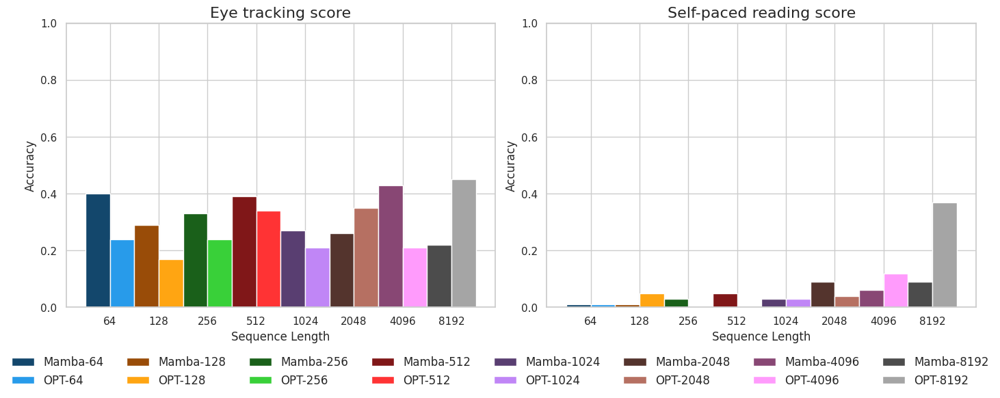

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Load JSON with detailed metrics
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# Extract subtasks from zero_shot_causal_reading
rows_subtask_scores = []

for ckpt_name, model_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    # Look only for zero_shot_causal_reading task
    zs_task = model_data.get("zero_shot_causal_reading", None)
    if zs_task is None:
        continue

    # Extract the two subtasks if available
    for subtask in ["eye_tracking_score", "self-paced_reading_score"]:
        score = zs_task.get(subtask, None)
        if score is not None:
            rows_subtask_scores.append({
                'model': model_type.capitalize(),
                'warmup': warmup,
                'seq_len': seq_len,
                'subtask': subtask,
                'score': score
            })

# Convert to DataFrame
df_subtasks = pd.DataFrame(rows_subtask_scores)
def plot_subtask_scores(df, metric_name, output_file):
    seq_order = sorted(df['seq_len'].unique())
    base_cmap = plt.get_cmap('tab10')
    colors = [base_cmap(i % base_cmap.N) for i in range(len(seq_order))]

    def shade_color(color, factor=0.7):
        c = np.array(color[:3])
        c = np.clip(c * factor, 0, 1)
        return (*c, color[3] if len(color) > 3 else 1.0)

    subtasks = df['subtask'].unique()
    n_subtasks = len(subtasks)

    # Create figure and 1 row x 2 cols subplots for subtasks
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 5), constrained_layout=True)

    for i, subtask in enumerate(subtasks):
        ax = axes[i]
        data = df[df['subtask'] == subtask]

        width = 0.5
        x = np.arange(len(seq_order))

        for j, seq_len in enumerate(seq_order):
            subset = data[data['seq_len'] == seq_len]
            mamba_score = subset[subset['model'] == 'Mamba']['score'].values
            opt_score = subset[subset['model'] == 'Opt']['score'].values

            mamba_score = mamba_score[0] if len(mamba_score) > 0 else 0
            opt_score = opt_score[0] if len(opt_score) > 0 else 0

            color = colors[j]
            mamba_color = shade_color(color, factor=0.6)
            opt_color = shade_color(color, factor=1.3)

            ax.bar(x[j] - width/2, mamba_score, width=width, color=mamba_color)
            ax.bar(x[j] + width/2, opt_score, width=width, color=opt_color)

        ax.set_xticks(x)
        ax.set_xticklabels(seq_order)
        ax.set_ylim(0, 1)
        ax.set_xlabel('Sequence Length')
        ax.set_ylabel('Accuracy')
        #ax.set_ylabel(metric_name)
        ax.set_title(subtask.replace("_", " ").capitalize(), fontsize=16)

    # Create a single legend below both subplots, spanning the entire figure width
    legend_elements = []
    for j, seq_len in enumerate(seq_order):
        color = colors[j]
        mamba_color = shade_color(color, factor=0.6)
        opt_color = shade_color(color, factor=1.3)
        legend_elements.append(Patch(facecolor=mamba_color, label=f'Mamba-{seq_len}'))
        legend_elements.append(Patch(facecolor=opt_color, label=f'OPT-{seq_len}'))

    # Add legend below subplots
    fig.legend(handles=legend_elements, loc='lower center', ncol=8, fontsize=12, frameon=False, bbox_to_anchor=(0.5, -0.15), bbox_transform=fig.transFigure)

    plt.subplots_adjust(bottom=-0.5)  # Make space at bottom for legend
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()


# Plot the two subtasks
plot_subtask_scores(df_subtasks, "Score", "zero_shot_causal_reading_subtasks.png")


Option 2

/tmp/ipython-input-83-1208863440.py:113: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(bottom=-0.5)  # Make space at bottom for legend


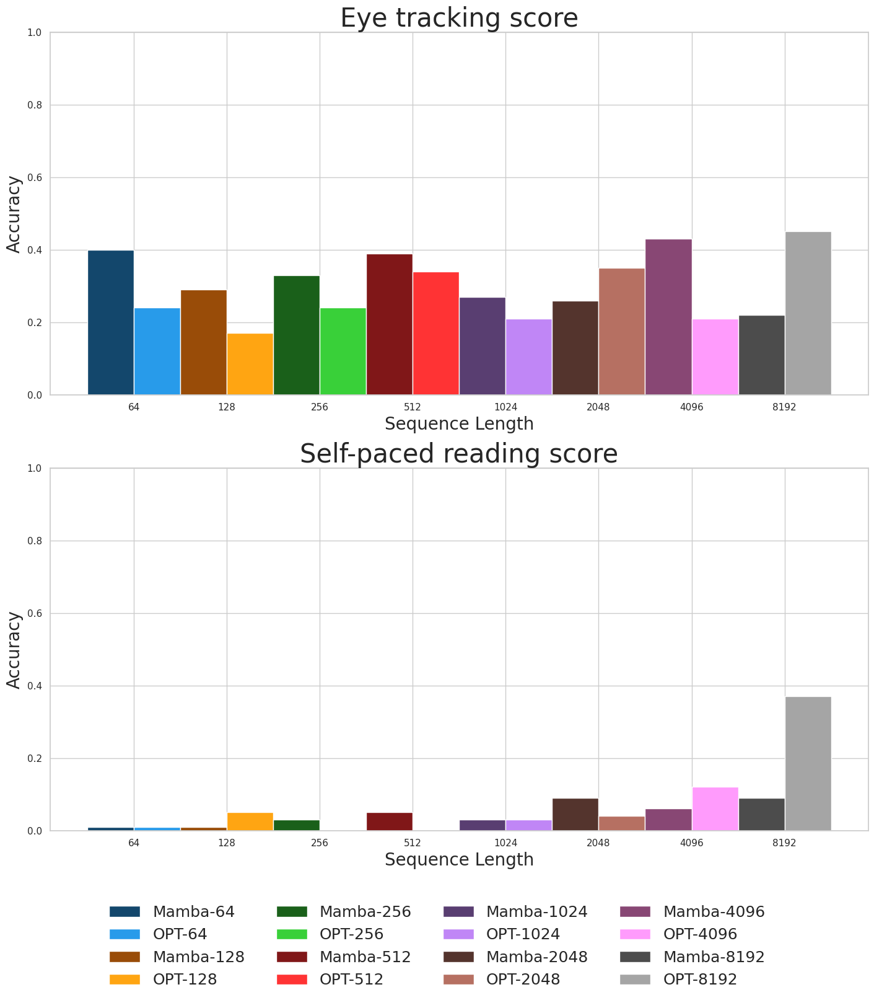

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Load JSON with detailed metrics
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# Extract subtasks from zero_shot_causal_reading
rows_subtask_scores = []

for ckpt_name, model_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    # Look only for zero_shot_causal_reading task
    zs_task = model_data.get("zero_shot_causal_reading", None)
    if zs_task is None:
        continue

    # Extract the two subtasks if available
    for subtask in ["eye_tracking_score", "self-paced_reading_score"]:
        score = zs_task.get(subtask, None)
        if score is not None:
            rows_subtask_scores.append({
                'model': model_type.capitalize(),
                'warmup': warmup,
                'seq_len': seq_len,
                'subtask': subtask,
                'score': score
            })

# Convert to DataFrame
df_subtasks = pd.DataFrame(rows_subtask_scores)
def plot_subtask_scores(df, metric_name, output_file):
    seq_order = sorted(df['seq_len'].unique())
    base_cmap = plt.get_cmap('tab10')
    colors = [base_cmap(i % base_cmap.N) for i in range(len(seq_order))]

    def shade_color(color, factor=0.7):
        c = np.array(color[:3])
        c = np.clip(c * factor, 0, 1)
        return (*c, color[3] if len(color) > 3 else 1.0)

    subtasks = df['subtask'].unique()
    n_subtasks = len(subtasks)

    # Create figure and 1 row x 2 cols subplots for subtasks
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 14), constrained_layout=True)

    for i, subtask in enumerate(subtasks):
        ax = axes[i]
        data = df[df['subtask'] == subtask]

        width = 0.5
        x = np.arange(len(seq_order))

        for j, seq_len in enumerate(seq_order):
            subset = data[data['seq_len'] == seq_len]
            mamba_score = subset[subset['model'] == 'Mamba']['score'].values
            opt_score = subset[subset['model'] == 'Opt']['score'].values

            mamba_score = mamba_score[0] if len(mamba_score) > 0 else 0
            opt_score = opt_score[0] if len(opt_score) > 0 else 0

            color = colors[j]
            mamba_color = shade_color(color, factor=0.6)
            opt_color = shade_color(color, factor=1.3)

            ax.bar(x[j] - width/2, mamba_score, width=width, color=mamba_color)
            ax.bar(x[j] + width/2, opt_score, width=width, color=opt_color)

        ax.set_xticks(x)
        ax.set_xticklabels(seq_order)
        ax.set_ylim(0, 1)
        ax.set_xlabel('Sequence Length', fontsize=20)
        ax.set_ylabel('Accuracy', fontsize=20)
        #ax.set_ylabel(metric_name)
        ax.set_title(subtask.replace("_", " ").capitalize(), fontsize=30)

    # Create a single legend below both subplots, spanning the entire figure width
    legend_elements = []
    for j, seq_len in enumerate(seq_order):
        color = colors[j]
        mamba_color = shade_color(color, factor=0.6)
        opt_color = shade_color(color, factor=1.3)
        legend_elements.append(Patch(facecolor=mamba_color, label=f'Mamba-{seq_len}'))
        legend_elements.append(Patch(facecolor=opt_color, label=f'OPT-{seq_len}'))

    # Add legend below subplots
    fig.legend(handles=legend_elements, loc='lower center', ncol=4, fontsize=18, frameon=False, bbox_to_anchor=(0.5, -0.15), bbox_transform=fig.transFigure)

    plt.subplots_adjust(bottom=-0.5)  # Make space at bottom for legend
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    plt.show()


# Plot the two subtasks
plot_subtask_scores(df_subtasks, "Score", "zero_shot_causal_reading_subtasks.png")

# Task Distribution

/tmp/ipython-input-87-2402245161.py:81: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_task, x="subtask", y="score", hue="model", dodge=True, color='black', alpha=0.3, jitter=0.2)


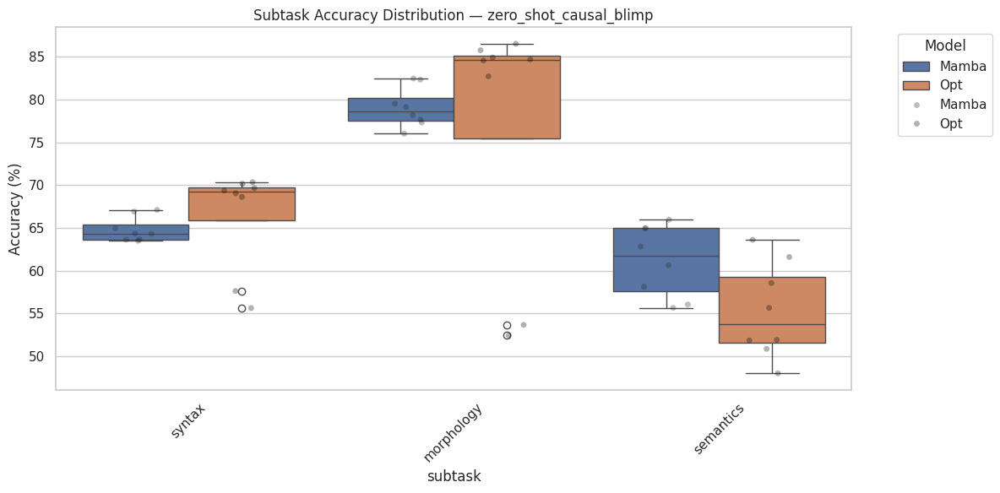

/tmp/ipython-input-87-2402245161.py:81: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_task, x="subtask", y="score", hue="model", dodge=True, color='black', alpha=0.3, jitter=0.2)


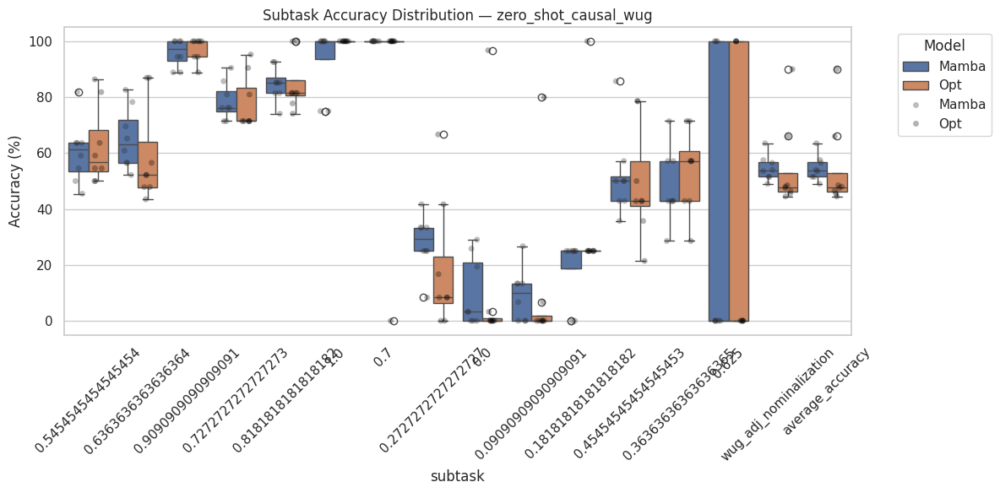

/tmp/ipython-input-87-2402245161.py:81: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_task, x="subtask", y="score", hue="model", dodge=True, color='black', alpha=0.3, jitter=0.2)


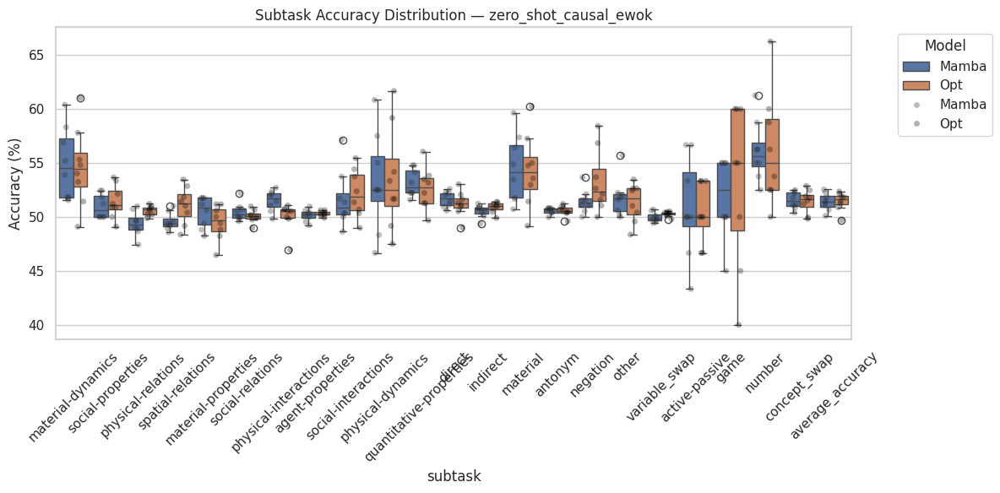

/tmp/ipython-input-87-2402245161.py:81: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_task, x="subtask", y="score", hue="model", dodge=True, color='black', alpha=0.3, jitter=0.2)


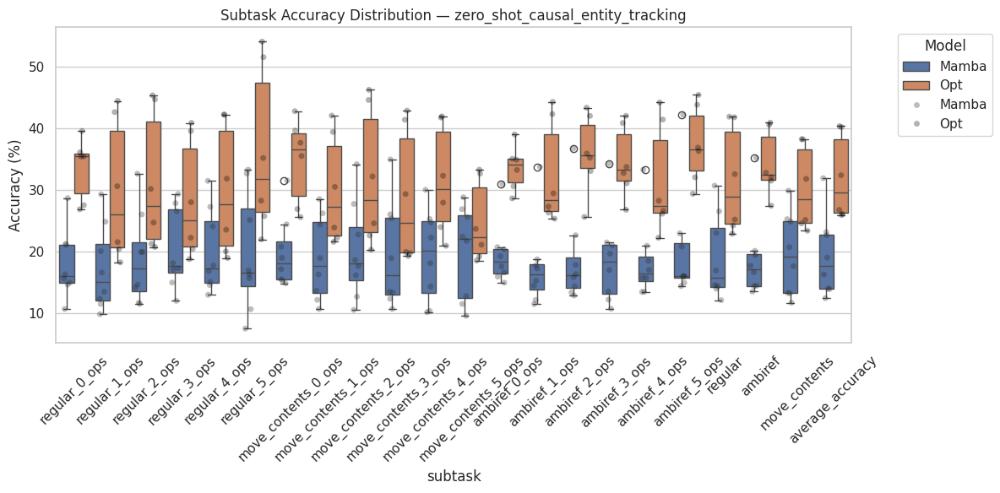

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def get_ckpt_number(ckpt_name):
    match = re.search(r"\d+", ckpt_name)
    return int(match.group()) if match else float("inf")

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# Load JSON
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# Define all causal tasks of interest
causal_tasks = {
    "zero_shot_causal_blimp": ["syntax", "morphology", "semantics"],
    #"zero_shot_causal_blimp": None,
    "zero_shot_causal_wug": None,  # Dynamic subtasks
    "zero_shot_causal_ewok": None,
    "zero_shot_causal_entity_tracking": None
}

all_rows = []

for ckpt_name, model_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, fixed_subtasks in causal_tasks.items():
        task_data = model_data.get(task, None)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            # Dig one level deeper
            blimp_scores = task_data.get("best_temperature_report.txt", {})
            for subtask in fixed_subtasks:
                if subtask in blimp_scores:
                    all_rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": blimp_scores[subtask]
                    })
        else:
            for subtask, score in task_data.items():
                all_rows.append({
                    "model": model_type.capitalize(),
                    "warmup": warmup,
                    "seq_len": seq_len,
                    "task": task,
                    "subtask": subtask,
                    "score": score
                })

# Convert to DataFrame
df = pd.DataFrame(all_rows)

# Plot each task separately
sns.set(style="whitegrid")
for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df_task, x="subtask", y="score", hue="model")
    sns.stripplot(data=df_task, x="subtask", y="score", hue="model", dodge=True, color='black', alpha=0.3, jitter=0.2)
    plt.title(f"Subtask Accuracy Distribution — {task_name}")
    plt.xticks(rotation=45)
    plt.ylabel("Accuracy (%)")
    plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


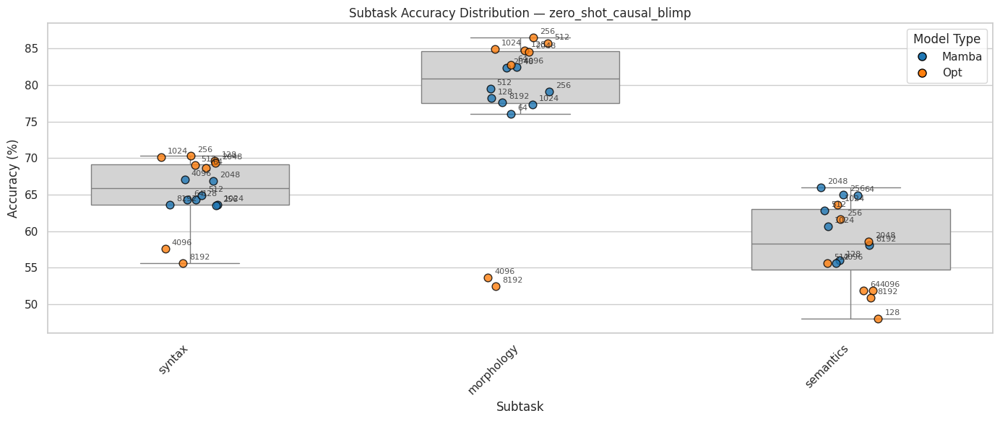

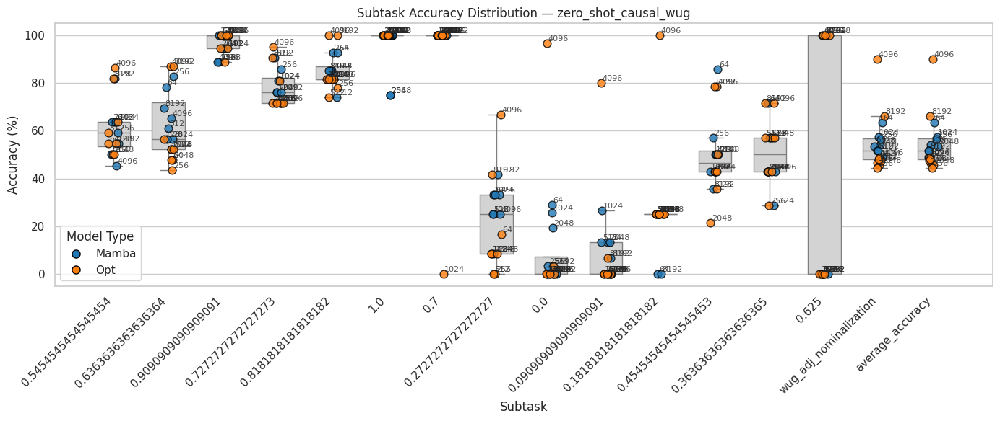

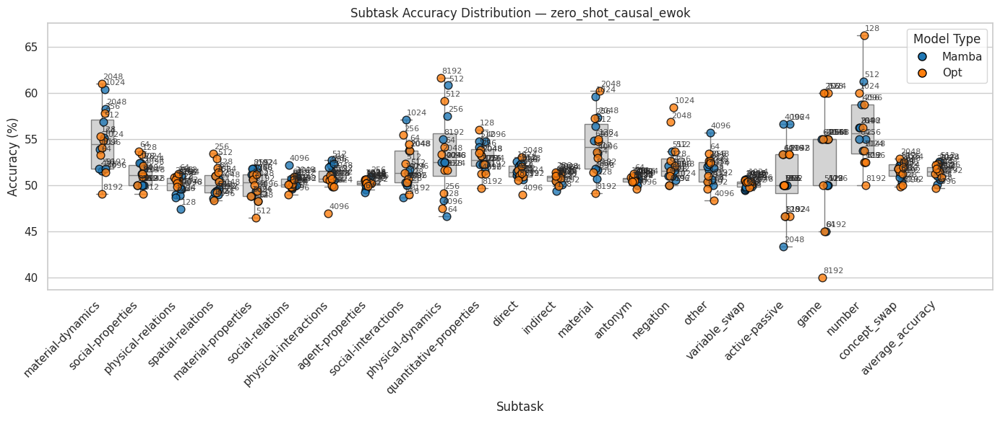

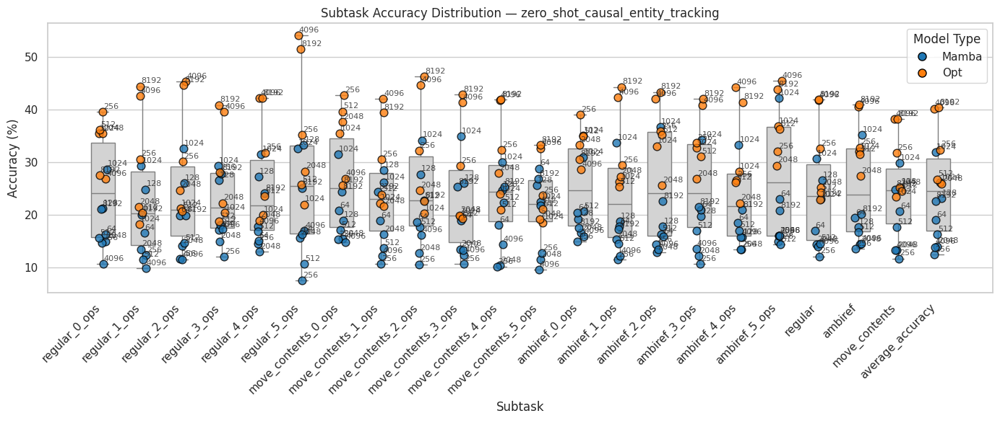

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Helpers ----------

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# ---------- Load Data ----------

with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# ---------- Parse Relevant Tasks ----------

rows = []

task_subtasks = {
    "zero_shot_causal_blimp": ["syntax", "morphology", "semantics"],
    "zero_shot_causal_wug": None,  # All keys are accuracy floats
    "zero_shot_causal_ewok": None,  # All keys are subtasks
    "zero_shot_causal_entity_tracking": None
}

for ckpt_name, ckpt_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, subtasks in task_subtasks.items():
        task_data = ckpt_data.get(task)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            subtask_data = task_data.get("best_temperature_report.txt", {})
            for subtask in subtasks:
                score = subtask_data.get(subtask)
                if score is not None:
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

        else:
            for subtask, score in task_data.items():
                if isinstance(score, (int, float)):
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

# ---------- Create DataFrame ----------

df = pd.DataFrame(rows)

# ---------- Plotting ----------

sns.set(style="whitegrid")
dot_colors = {
    "Mamba": "#1f77b4",  # blue
    "Opt": "#ff7f0e"     # orange
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]

    plt.figure(figsize=(14, 6))

    # Boxplot (neutral)
    sns.boxplot(
        data=df_task,
        x="subtask",
        y="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray'
    )

    # Dot + seq_len label
    for i, row in df_task.iterrows():
        x_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2  # add horizontal jitter
        plt.scatter(
            x_pos + jitter,
            row["score"],
            color=dot_colors.get(row["model"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.8,
            zorder=3
        )
        # Add seq_len label
        plt.text(
            x_pos + jitter + 0.02,
            row["score"] + 0.3,
            str(row["seq_len"]),
            fontsize=8,
            alpha=0.8,
            ha='left',
            va='bottom',
            zorder=4
        )

    # Legend
    handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=label,
                   markerfacecolor=color, markeredgecolor='black', markersize=8)
        for label, color in dot_colors.items()
    ]
    plt.legend(handles=handles, title="Model Type")

    # Format
    plt.title(f"Subtask Accuracy Distribution — {task_name}")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Accuracy (%)")
    plt.xlabel("Subtask")
    plt.tight_layout()
    plt.show()


Flip Axes

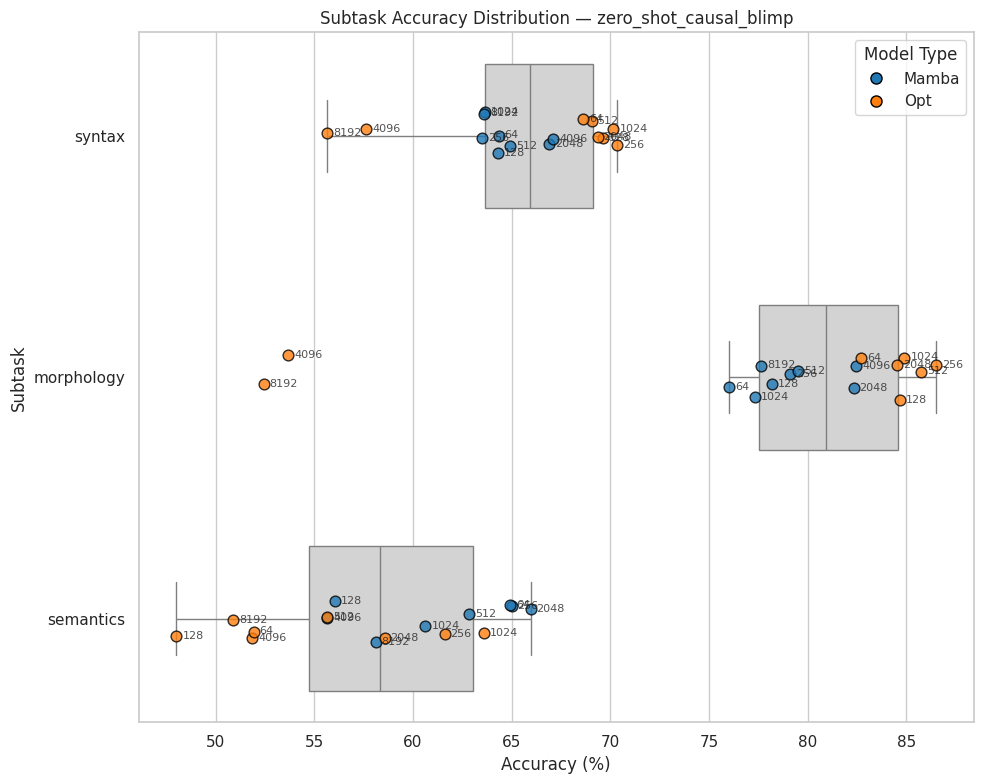

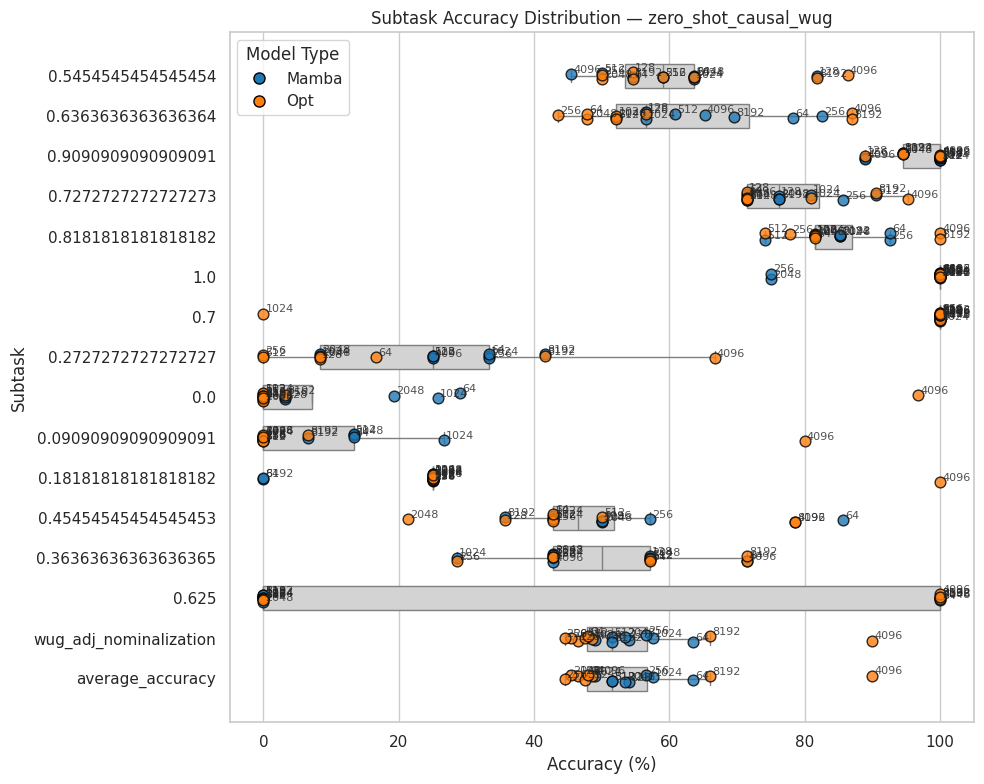

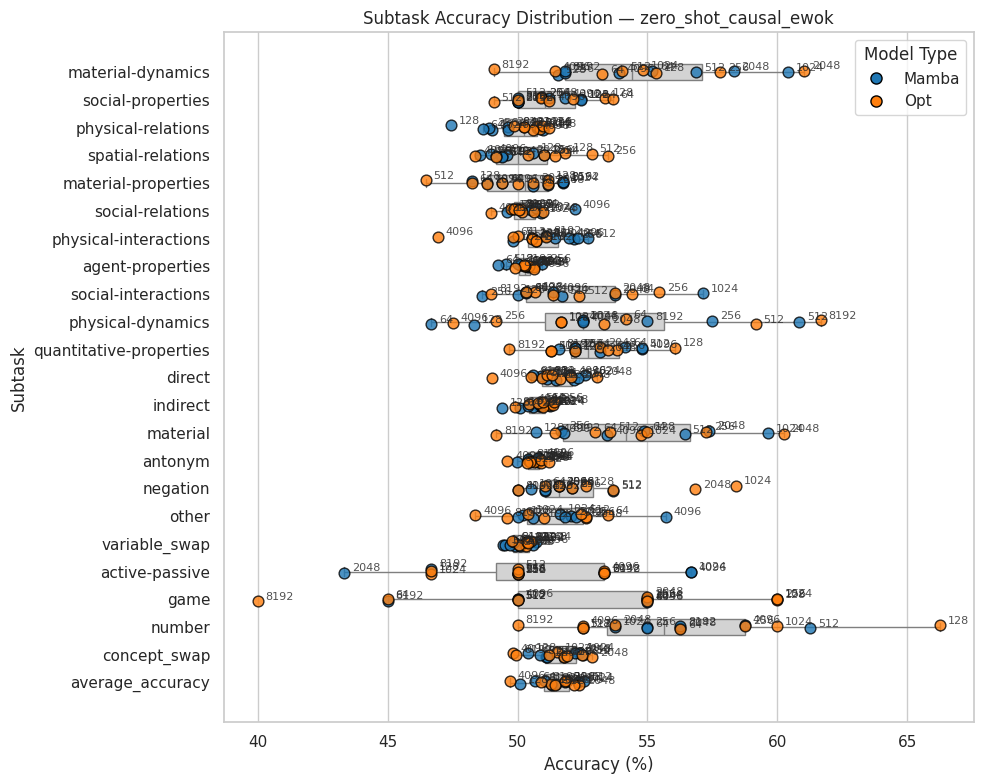

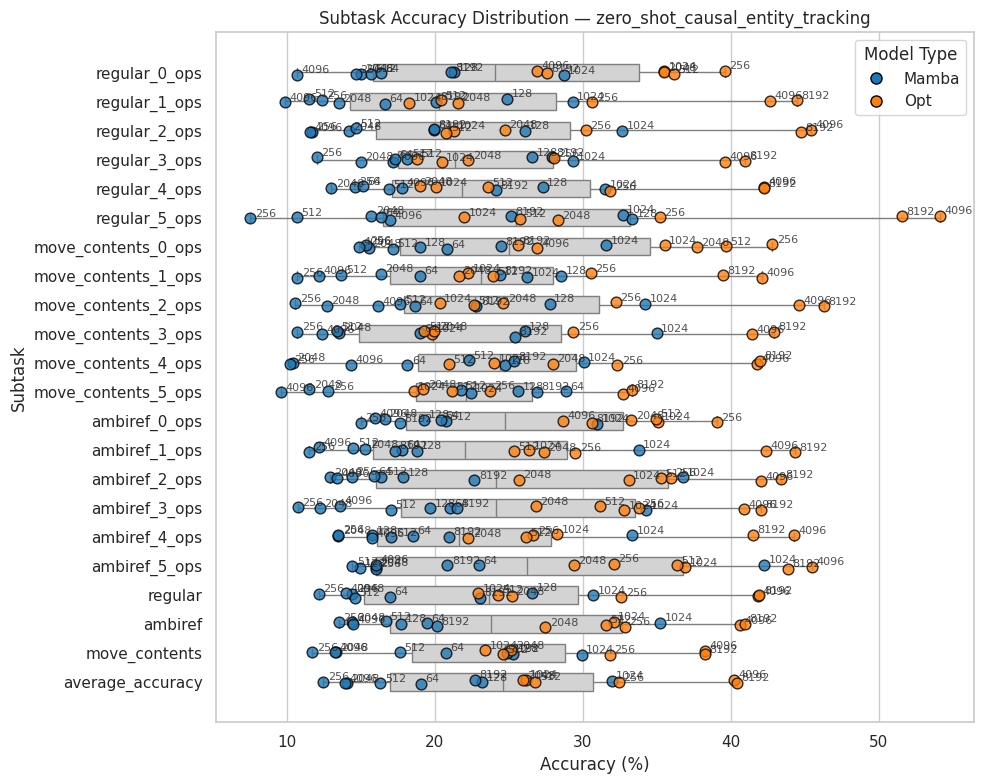

In [ ]:
import json
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np  # Added for jitter

# ---------- Helpers ----------

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# ---------- Load Data ----------

with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# ---------- Parse Relevant Tasks ----------

rows = []

task_subtasks = {
    "zero_shot_causal_blimp": ["syntax", "morphology", "semantics"],
    "zero_shot_causal_wug": None,
    "zero_shot_causal_ewok": None,
    "zero_shot_causal_entity_tracking": None
}

for ckpt_name, ckpt_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, subtasks in task_subtasks.items():
        task_data = ckpt_data.get(task)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            subtask_data = task_data.get("best_temperature_report.txt", {})
            for subtask in subtasks:
                score = subtask_data.get(subtask)
                if score is not None:
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

        else:
            for subtask, score in task_data.items():
                if isinstance(score, (int, float)):
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

# ---------- Create DataFrame ----------

df = pd.DataFrame(rows)

# ---------- Plotting (Flipped Axes) ----------

sns.set(style="whitegrid")
dot_colors = {
    "Mamba": "#1f77b4",  # blue
    "Opt": "#ff7f0e"     # orange
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]

    plt.figure(figsize=(10, 8))

    # Boxplot (horizontal)
    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    # Dot + seq_len label
    for i, row in df_task.iterrows():
        y_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2  # vertical jitter
        plt.scatter(
            row["score"],
            y_pos + jitter,
            color=dot_colors.get(row["model"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.8,
            zorder=3
        )
        # Add seq_len label
        plt.text(
            row["score"] + 0.3,
            y_pos + jitter + 0.02,
            str(row["seq_len"]),
            fontsize=8,
            alpha=0.8,
            ha='left',
            va='bottom',
            zorder=4
        )

    # Legend
    handles = [
        plt.Line2D([0], [0], marker='o', color='w', label=label,
                   markerfacecolor=color, markeredgecolor='black', markersize=8)
        for label, color in dot_colors.items()
    ]
    plt.legend(handles=handles, title="Model Type")

    # Format
    plt.title(f"Subtask Accuracy Distribution — {task_name}")
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-91-1568168595.py:85: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20", len(unique_seq_lens))
/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


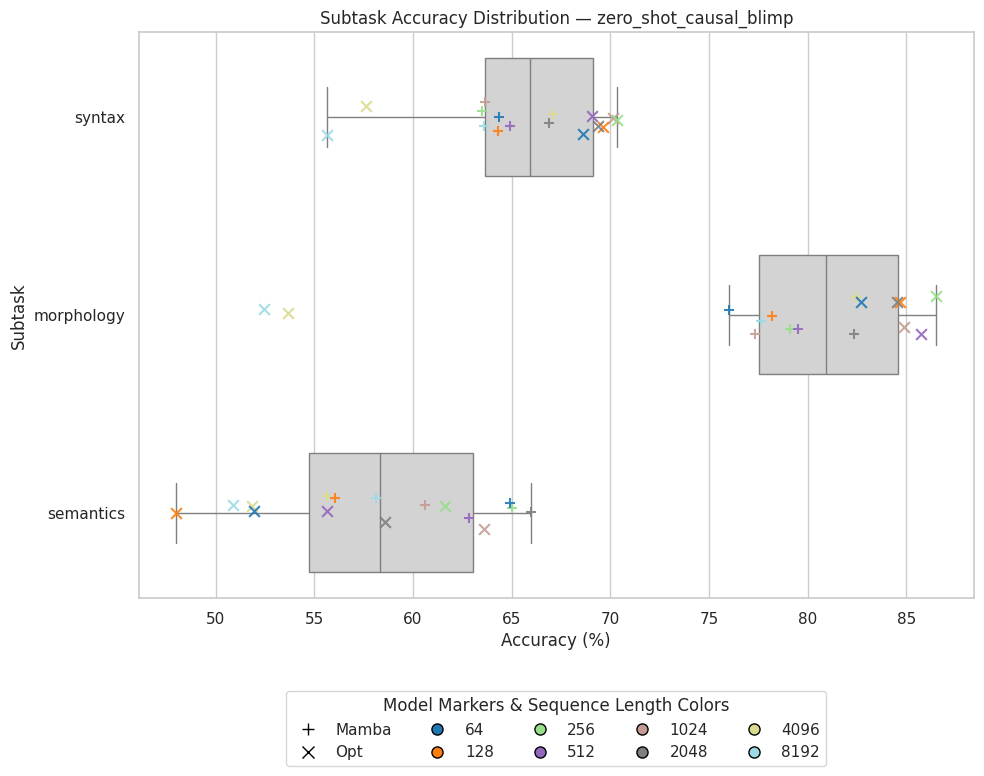

/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


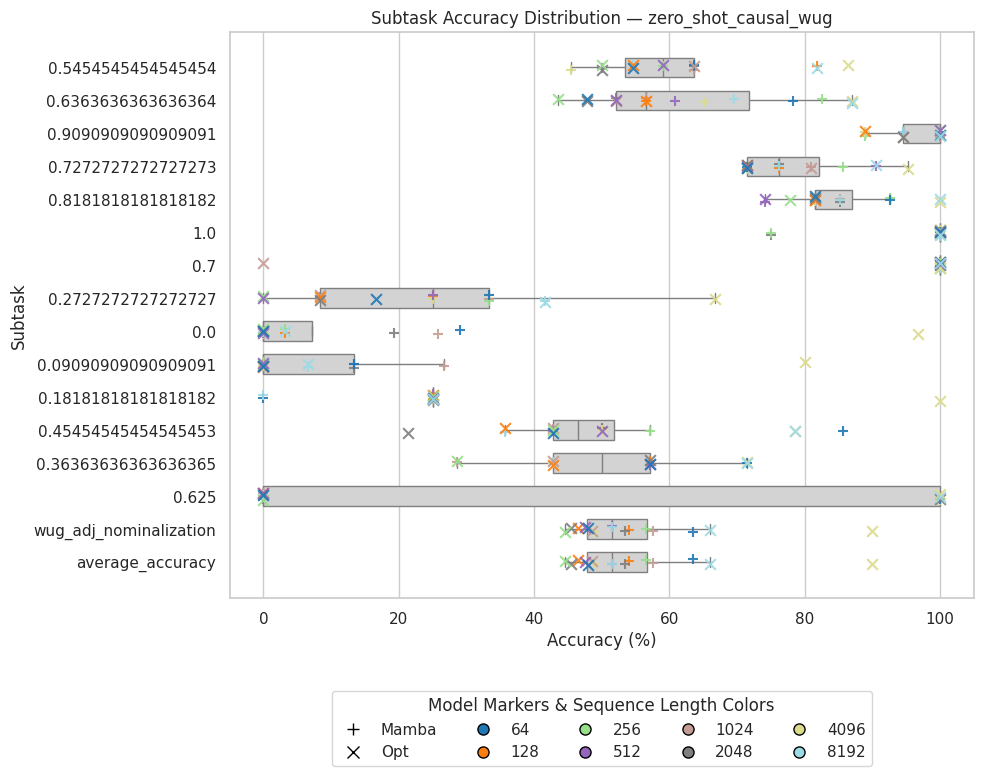

/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


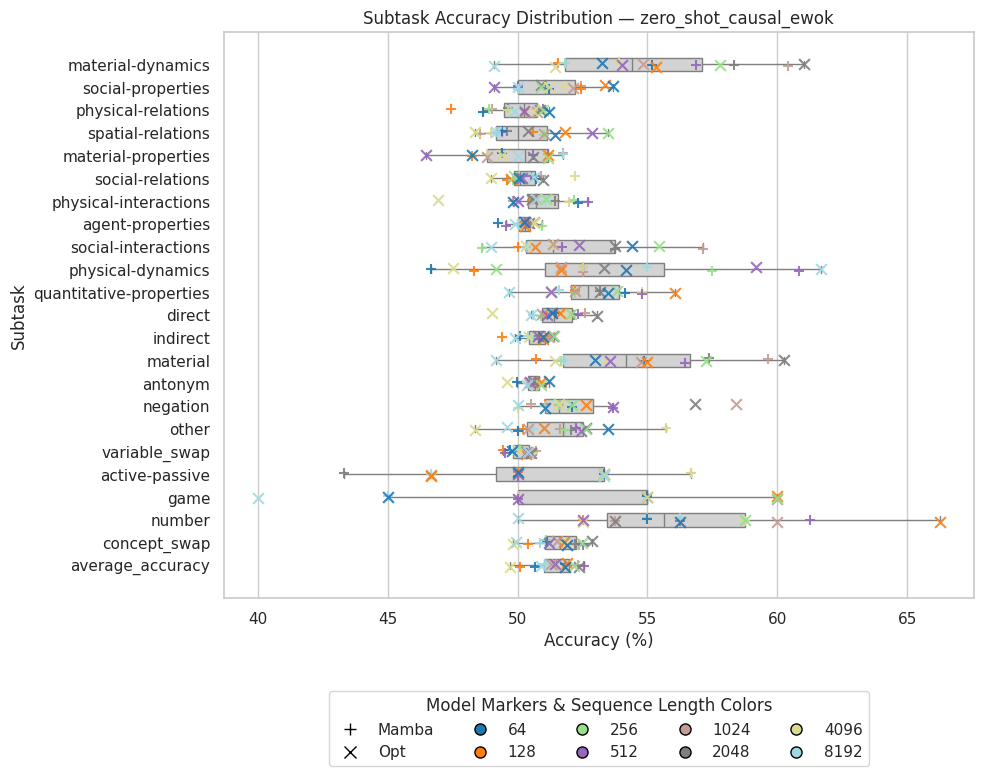

/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-91-1568168595.py:114: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


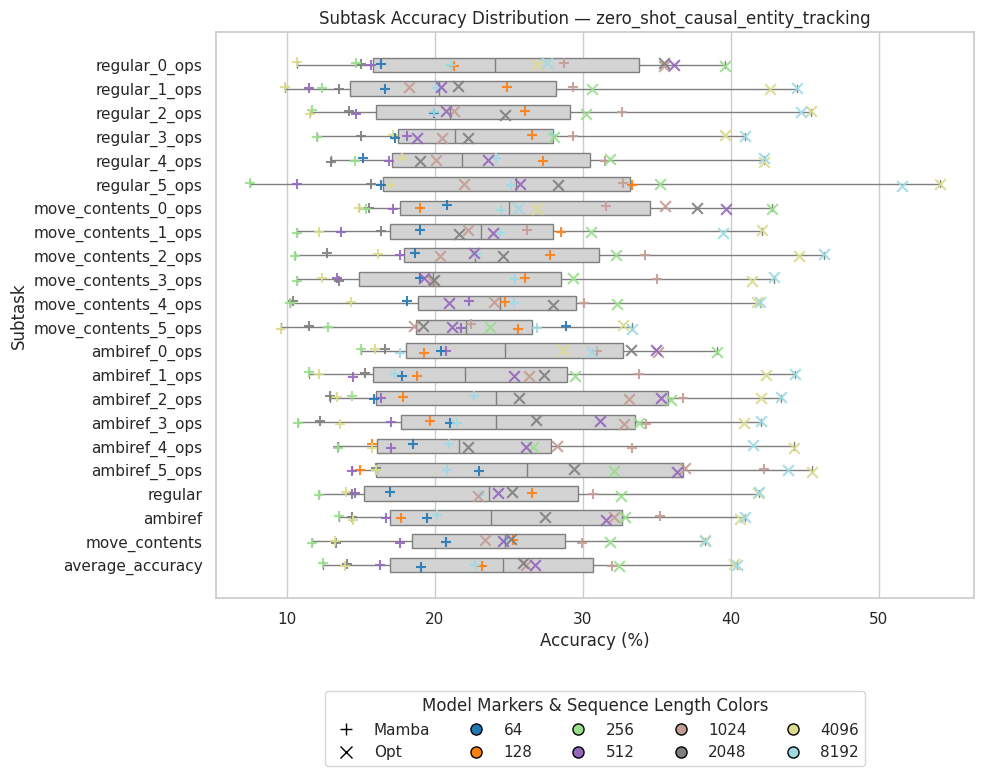

In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap

# ---------- Helpers ----------

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

# ---------- Load Data ----------

with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# ---------- Parse Tasks ----------

rows = []

task_subtasks = {
    "zero_shot_causal_blimp": ["syntax", "morphology", "semantics","syntax-semantics"],
    "zero_shot_causal_wug": None,
    "zero_shot_causal_ewok": None,
    "zero_shot_causal_entity_tracking": None
}

for ckpt_name, ckpt_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, subtasks in task_subtasks.items():
        task_data = ckpt_data.get(task)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            subtask_data = task_data.get("best_temperature_report.txt", {})
            for subtask in subtasks:
                score = subtask_data.get(subtask)
                if score is not None:
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

        else:
            for subtask, score in task_data.items():
                if isinstance(score, (int, float)):
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

# ---------- Create DataFrame ----------

df = pd.DataFrame(rows)

# ---------- Plotting ----------

sns.set(style="whitegrid")

# Define color palette for sequence lengths
unique_seq_lens = sorted(df["seq_len"].unique())
cmap = get_cmap("tab20", len(unique_seq_lens))
seq_len_to_color = {seq: cmap(i) for i, seq in enumerate(unique_seq_lens)}

# Marker mapping for models
model_to_marker = {
    "Mamba": "+",
    "Opt": "x"
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(10, 8))

    # Draw background boxplot
    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    # Overlay custom scatter with color/marker encoding
    for i, row in df_task.iterrows():
        y_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2  # vertical jitter
        plt.scatter(
            row["score"],
            y_pos + jitter,
            marker=model_to_marker.get(row["model"], "o"),
            color=seq_len_to_color.get(row["seq_len"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.9,
            zorder=3
        )

    # ----- Legends -----

    # Model marker legend
    model_handles = [
        Line2D([0], [0], marker=marker, color='w', label=model,
               markerfacecolor='gray', markeredgecolor='black', markersize=8)
        for model, marker in model_to_marker.items()
    ]

    # Sequence length color legend (max 10 per row)
    seq_len_handles = [
        Line2D([0], [0], marker='o', color='w', label=str(seq_len),
               markerfacecolor=color, markeredgecolor='black', markersize=8)
        for seq_len, color in seq_len_to_color.items()
    ]

    plt.legend(handles=model_handles + seq_len_handles,
               title="Model Markers & Sequence Length Colors",
               bbox_to_anchor=(0.5, -0.15),
               loc='upper center',
               ncol=5,
               frameon=True)

    # Title & labels
    plt.title(f"Subtask Accuracy Distribution — {task_name}")
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    plt.show()


with labels

/tmp/ipython-input-99-2196519177.py:88: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20", len(unique_seq_lens))
/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


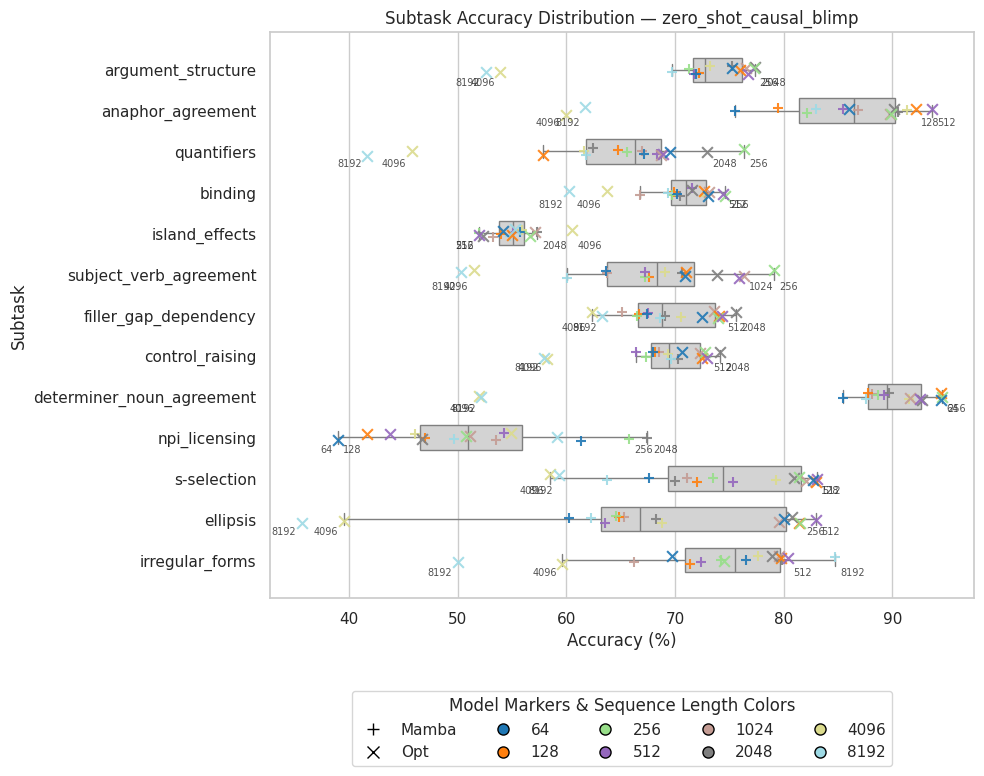

/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


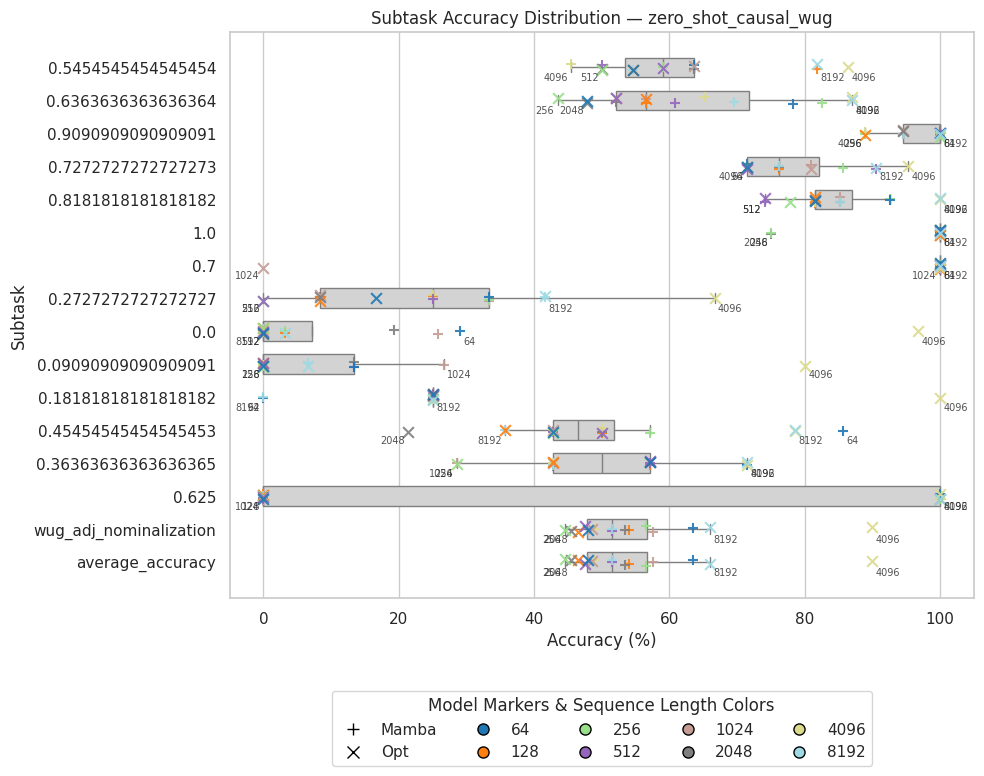

/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


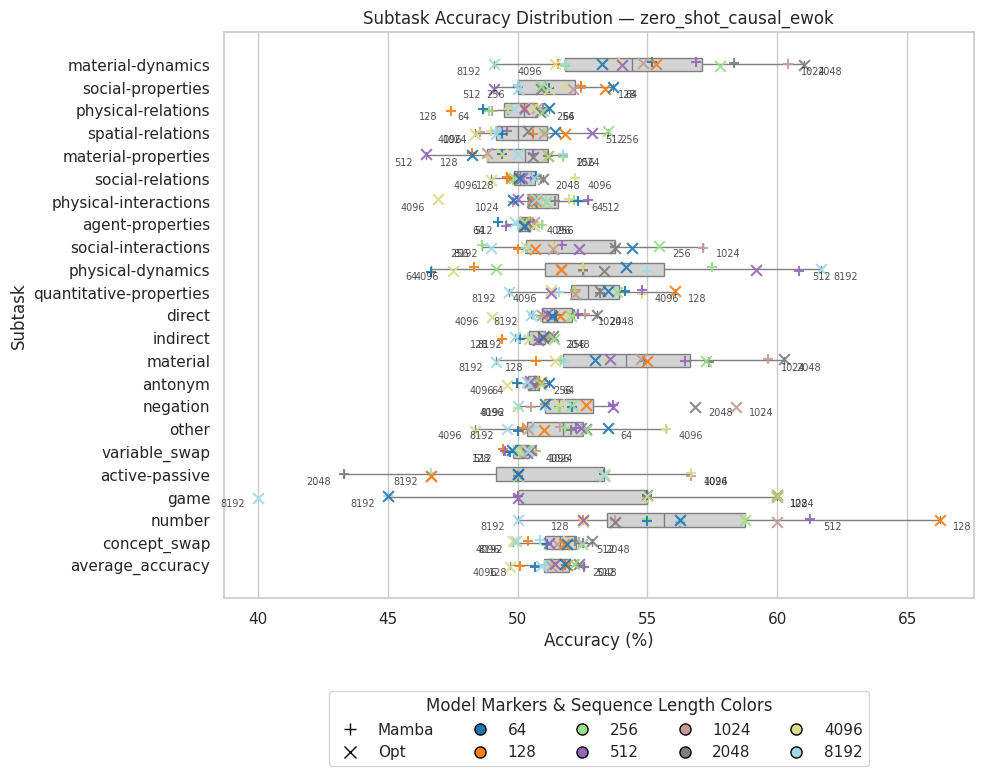

/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-99-2196519177.py:116: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


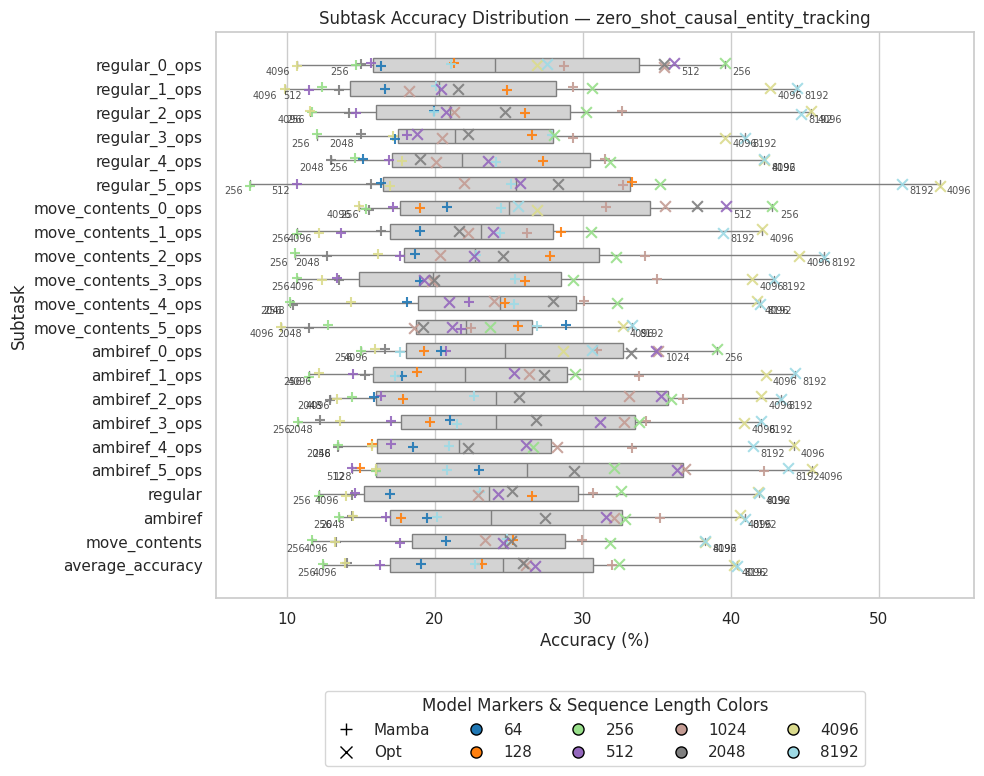

In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap

# ---------- Helpers ----------

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

def model_label(row):
    return f"{row['model']}-{row['seq_len']}"

# ---------- Load Data ----------

with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# ---------- Parse Tasks ----------

rows = []

task_subtasks = {
    #"zero_shot_causal_blimp": ["syntax", "morphology", "semantics"],
    "zero_shot_causal_blimp": ["argument_structure", "anaphor_agreement", "quantifiers","binding","island_effects","subject_verb_agreement","filler_gap_dependency","control_raising","determiner_noun_agreement","npi_licensing","s-selection", "ellipsis", "irregular_forms"],
    "zero_shot_causal_wug": None,
    "zero_shot_causal_ewok": None,
    "zero_shot_causal_entity_tracking": None
}

for ckpt_name, ckpt_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, subtasks in task_subtasks.items():
        task_data = ckpt_data.get(task)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            subtask_data = task_data.get("best_temperature_report.txt", {})
            for subtask in subtasks:
                score = subtask_data.get(subtask)
                if score is not None:
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

        else:
            for subtask, score in task_data.items():
                if isinstance(score, (int, float)):
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

# ---------- Create DataFrame ----------

df = pd.DataFrame(rows)

# ---------- Plotting ----------

sns.set(style="whitegrid")

unique_seq_lens = sorted(df["seq_len"].unique())
cmap = get_cmap("tab20", len(unique_seq_lens))
seq_len_to_color = {seq: cmap(i) for i, seq in enumerate(unique_seq_lens)}

model_to_marker = {
    "Mamba": "+",
    "Opt": "x"
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(10, 8))

    # Draw background boxplot
    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    # Overlay scatter points
    for i, row in df_task.iterrows():
        y_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2
        plt.scatter(
            row["score"],
            y_pos + jitter,
            marker=model_to_marker.get(row["model"], "o"),
            color=seq_len_to_color.get(row["seq_len"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.9,
            zorder=3
        )

    # Add model labels for 2 smallest and 2 largest scores per subtask
    for subtask in df_task["subtask"].unique():
        df_sub = df_task[df_task["subtask"] == subtask]

        # Sort ascending by score
        df_sorted = df_sub.sort_values("score")

        y_pos = list(df_task["subtask"].unique()).index(subtask)

        # Label 3 smallest scores
        smallest = df_sorted.head(2)
        for _, row in smallest.iterrows():
            plt.text(
                row["score"] - 0.5,  # a little left of point
                y_pos + 0.3,
                str(row['seq_len']),
                #f"{row['model']}-{row['seq_len']}",
                fontsize=7,
                #color=seq_len_to_color.get(row["seq_len"], "gray"),
                ha='right',
                va='center',
                alpha=0.8,
                zorder=5
            )

        # Label 3 largest scores
        largest = df_sorted.tail(2)
        for _, row in largest.iterrows():
            plt.text(
                row["score"] + 0.5,  # a little right of point
                y_pos + 0.3,
                str(row['seq_len']),
                #f"{row['model']}-{row['seq_len']}",
                fontsize=7,
                #color=seq_len_to_color.get(row["seq_len"], "gray"),
                ha='left',
                va='center',
                alpha=0.8,
                zorder=5
            )

    # Legends
    model_handles = [
        Line2D([0], [0], marker=marker, color='w', label=model,
               markerfacecolor='gray', markeredgecolor='black', markersize=8)
        for model, marker in model_to_marker.items()
    ]
    seq_len_handles = [
        Line2D([0], [0], marker='o', color='w', label=str(seq_len),
               markerfacecolor=color, markeredgecolor='black', markersize=8)
        for seq_len, color in seq_len_to_color.items()
    ]

    plt.legend(handles=model_handles + seq_len_handles,
               title="Model Markers & Sequence Length Colors",
               bbox_to_anchor=(0.5, -0.15),
               loc='upper center',
               ncol=5,
               frameon=True)

    plt.title(f"Subtask Accuracy Distribution — {task_name}")
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    plt.show()


adding spacing constraint

/tmp/ipython-input-103-1853029298.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20", len(unique_seq_lens))
/tmp/ipython-input-103-1853029298.py:146: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-103-1853029298.py:146: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-103-1853029298.py:146: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the face

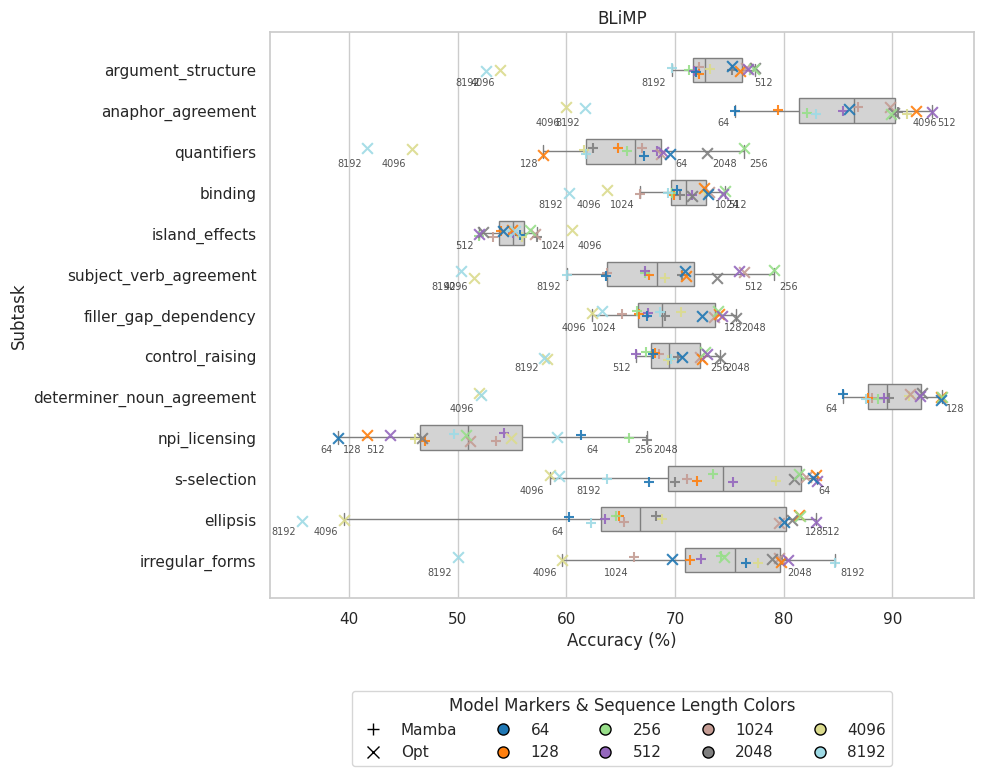

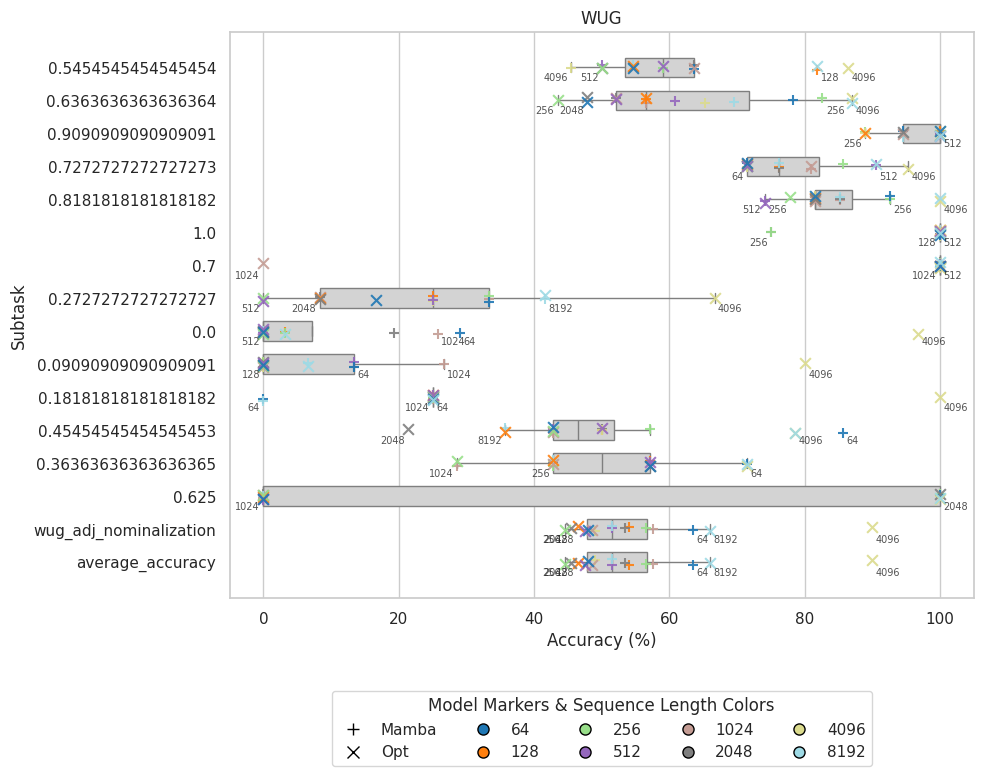

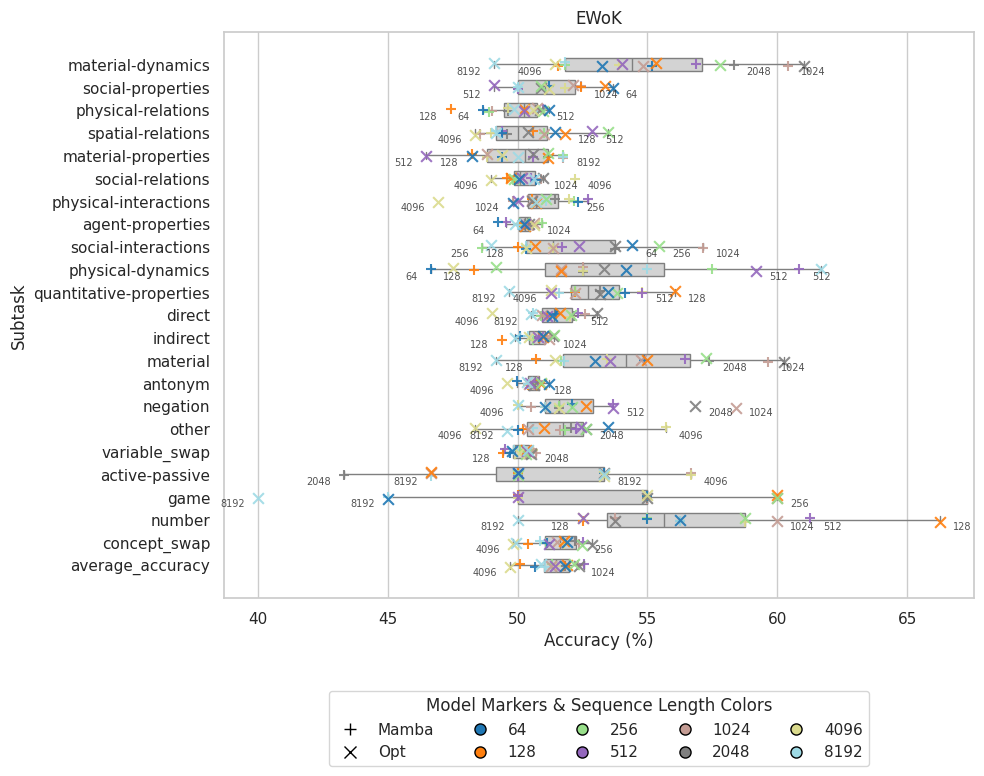

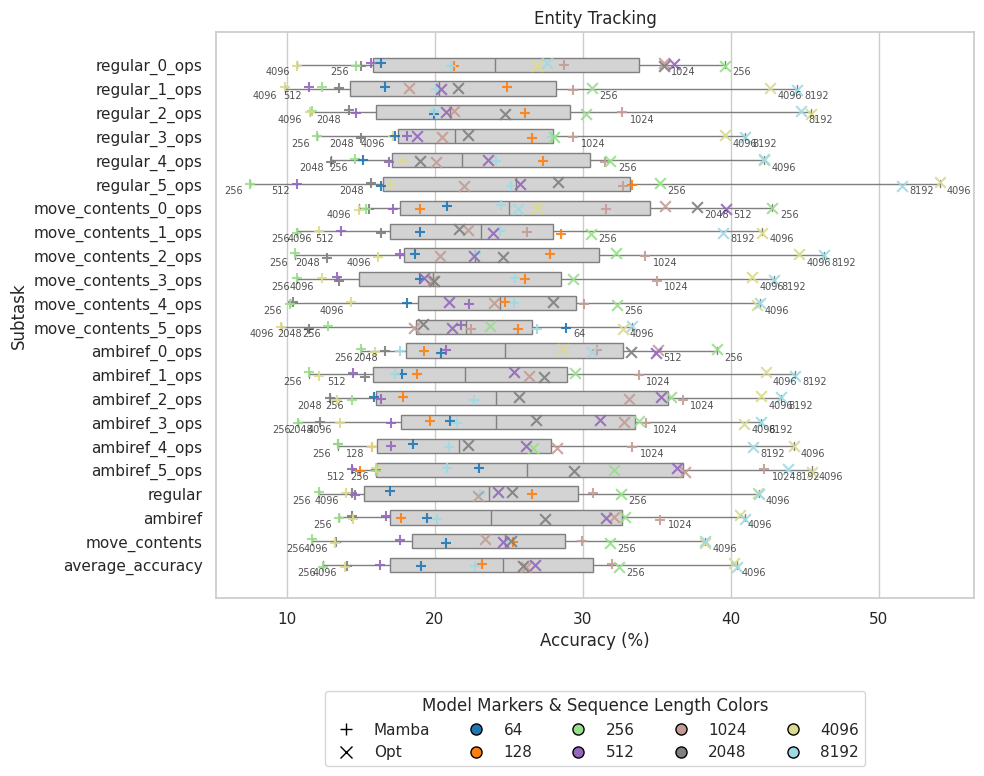

In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap
import os

# ---------- Helpers ----------

def parse_model_name(name):
    parts = name.split("-")
    model_type = parts[0] if parts[0] in {"mamba", "opt"} else None
    seq_len = None
    warmup = "-"
    for part in parts[1:]:
        if part.isdigit():
            seq_len = int(part)
        elif "warmup" in part:
            warmup = "+"
    return model_type, warmup, seq_len

def model_label(row):
    return f"{row['model']}-{row['seq_len']}"

def label_with_spacing(df_sorted, y_pos, side="left", spacing=1.0):
    labeled_scores = []
    for _, row in df_sorted.iterrows():
        too_close = any(abs(row["score"] - s) < spacing for s in labeled_scores)
        if too_close:
            continue
        offset = -0.5 if side == "left" else 0.5
        ha = "right" if side == "left" else "left"
        plt.text(
            row["score"] + offset,
            y_pos + 0.3,
            str(row['seq_len']),
            fontsize=7,
            ha=ha,
            va='center',
            alpha=0.8,
            zorder=5
        )
        labeled_scores.append(row["score"])

# ---------- Load Data ----------

with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_last_checkpoint_detailed.json', 'r') as f:
    data = json.load(f)

# ---------- Parse Tasks ----------

rows = []

task_subtasks = {
    "zero_shot_causal_blimp": ["argument_structure", "anaphor_agreement", "quantifiers","binding","island_effects","subject_verb_agreement","filler_gap_dependency","control_raising","determiner_noun_agreement","npi_licensing","s-selection", "ellipsis", "irregular_forms"],
    "zero_shot_causal_wug": None,
    "zero_shot_causal_ewok": None,
    "zero_shot_causal_entity_tracking": None
}

pretty_task_names = {
    "zero_shot_causal_blimp": "BLiMP",
    "zero_shot_causal_wug": "WUG",
    "zero_shot_causal_ewok": "EWoK",
    "zero_shot_causal_entity_tracking": "Entity Tracking"
}


for ckpt_name, ckpt_data in data.items():
    model_type, warmup, seq_len = parse_model_name(ckpt_name)
    if model_type is None or seq_len is None:
        continue

    for task, subtasks in task_subtasks.items():
        task_data = ckpt_data.get(task)
        if task_data is None:
            continue

        if task == "zero_shot_causal_blimp":
            subtask_data = task_data.get("best_temperature_report.txt", {})
            for subtask in subtasks:
                score = subtask_data.get(subtask)
                if score is not None:
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

        else:
            for subtask, score in task_data.items():
                if isinstance(score, (int, float)):
                    rows.append({
                        "model": model_type.capitalize(),
                        "warmup": warmup,
                        "seq_len": seq_len,
                        "task": task,
                        "subtask": subtask,
                        "score": score
                    })

# ---------- Create DataFrame ----------

df = pd.DataFrame(rows)

# ---------- Plotting ----------

sns.set(style="whitegrid")

unique_seq_lens = sorted(df["seq_len"].unique())
cmap = get_cmap("tab20", len(unique_seq_lens))
seq_len_to_color = {seq: cmap(i) for i, seq in enumerate(unique_seq_lens)}

model_to_marker = {
    "Mamba": "+",
    "Opt": "x"
}



for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(10, 8))

    # Draw background boxplot
    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    # Overlay scatter points
    for i, row in df_task.iterrows():
        y_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2
        plt.scatter(
            row["score"],
            y_pos + jitter,
            marker=model_to_marker.get(row["model"], "o"),
            color=seq_len_to_color.get(row["seq_len"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.9,
            zorder=3
        )

    # Add selective labels for seq_len with spacing constraint
    for subtask in df_task["subtask"].unique():
        df_sub = df_task[df_task["subtask"] == subtask]
        df_sorted = df_sub.sort_values("score")
        y_pos = list(df_task["subtask"].unique()).index(subtask)

        label_with_spacing(df_sorted.head(3), y_pos, side="left", spacing=1.0)
        label_with_spacing(df_sorted.tail(3), y_pos, side="right", spacing=1.0)

    # Legends
    model_handles = [
        Line2D([0], [0], marker=marker, color='w', label=model,
               markerfacecolor='gray', markeredgecolor='black', markersize=8)
        for model, marker in model_to_marker.items()
    ]
    seq_len_handles = [
        Line2D([0], [0], marker='o', color='w', label=str(seq_len),
               markerfacecolor=color, markeredgecolor='black', markersize=8)
        for seq_len, color in seq_len_to_color.items()
    ]

    plt.legend(handles=model_handles + seq_len_handles,
               title="Model Markers & Sequence Length Colors",
               bbox_to_anchor=(0.5, -0.15),
               loc='upper center',
               ncol=5,
               frameon=True)
    task_title = pretty_task_names.get(task_name, task_name.replace("zero_shot_causal_", "").capitalize())
    task_filename = task_name.replace("zero_shot_causal_", "")
    plt.title(task_title)
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    save_path = f"{task_filename}_subtask_accuracy.png"
    plt.savefig(save_path, dpi=300)



BLiMP Suppl. from Detailed Results

/tmp/ipython-input-117-63293663.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20", len(unique_seq_lens))
/tmp/ipython-input-117-63293663.py:91: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-117-63293663.py:91: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(


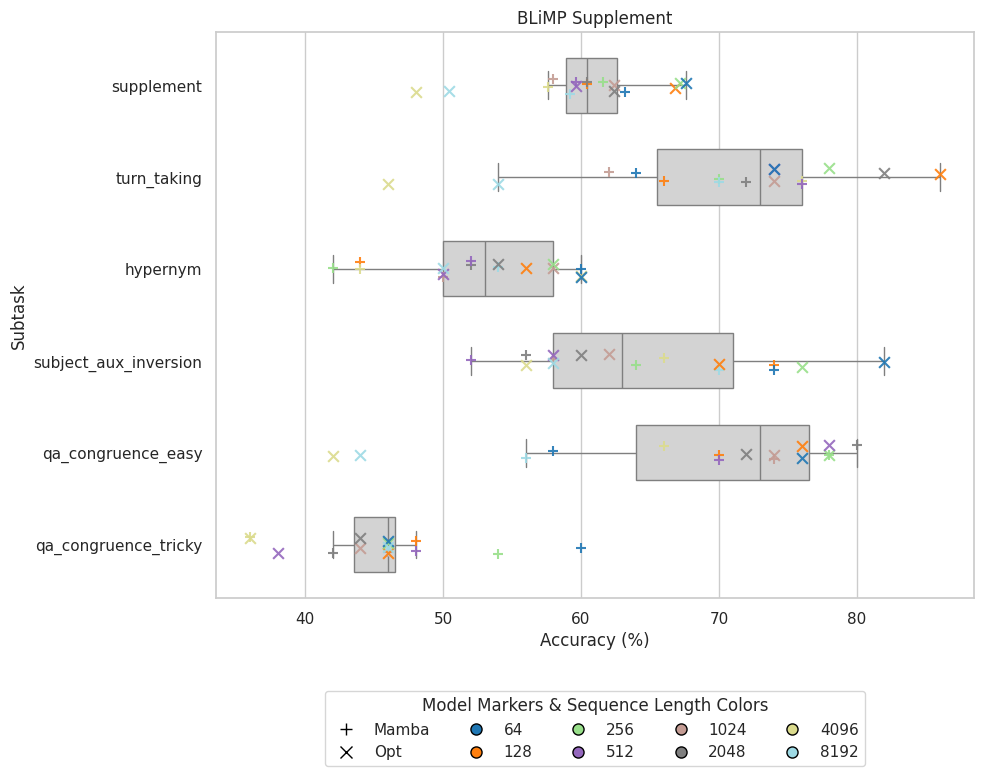

In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap

# Your custom label function (placeholder, you need your actual one)
def label_with_spacing(df_sub_sorted, y_pos, side="left", spacing=1.0):
    # Implement your logic here
    # For example, place text labels with some vertical/horizontal spacing
    pass

pretty_task_names = {
    "zero_shot_causal_blimp_supplement_fast": "BLiMP Supplement"
}

# Load JSON
with open('/content/drive/MyDrive/CST/BabyLM-Idea/Strict-2025/all_models_detailed_results.json', 'r') as f:
    data = json.load(f)

rows = []

for model_name, checkpoints in data.items():
    parts = model_name.split("-")
    model_type = parts[0].capitalize()
    seq_len = None
    for p in parts:
        if p.isdigit():
            seq_len = int(p)
            break
    if seq_len is None:
        continue

    if "1000M" not in checkpoints:
        continue
    ckpt_data = checkpoints["1000M"]

    task_name = "zero_shot_causal_blimp_supplement_fast"
    task_data = ckpt_data.get(task_name)
    if not task_data:
        continue

    for subtask, score in task_data.items():
        if subtask == "average_accuracy":
            continue
        rows.append({
            "model": model_type,
            "seq_len": seq_len,
            "task": task_name,
            "subtask": subtask,
            "score": score
        })

df = pd.DataFrame(rows)

# ---------- Plotting ----------

sns.set(style="whitegrid")

unique_seq_lens = sorted(df["seq_len"].unique())
cmap = get_cmap("tab20", len(unique_seq_lens))
seq_len_to_color = {seq: cmap(i) for i, seq in enumerate(unique_seq_lens)}

model_to_marker = {
    "Mamba": "+",
    "Opt": "x"
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(10, 8))

    # Draw background boxplot
    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    # Overlay scatter points
    for i, row in df_task.iterrows():
        y_pos = list(df_task["subtask"].unique()).index(row["subtask"])
        jitter = (0.5 - np.random.rand()) * 0.2
        plt.scatter(
            row["score"],
            y_pos + jitter,
            marker=model_to_marker.get(row["model"], "o"),
            color=seq_len_to_color.get(row["seq_len"], "gray"),
            edgecolor="black",
            s=60,
            alpha=0.9,
            zorder=3
        )

    # Add selective labels for seq_len with spacing constraint
    for subtask in df_task["subtask"].unique():
        df_sub = df_task[df_task["subtask"] == subtask]
        df_sorted = df_sub.sort_values("score")
        y_pos = list(df_task["subtask"].unique()).index(subtask)

        label_with_spacing(df_sorted.head(3), y_pos, side="left", spacing=1.0)
        label_with_spacing(df_sorted.tail(3), y_pos, side="right", spacing=1.0)

    # Legends
    model_handles = [
        Line2D([0], [0], marker=marker, color='w', label=model,
               markerfacecolor='gray', markeredgecolor='black', markersize=8)
        for model, marker in model_to_marker.items()
    ]
    seq_len_handles = [
        Line2D([0], [0], marker='o', color='w', label=str(seq_len),
               markerfacecolor=color, markeredgecolor='black', markersize=8)
        for seq_len, color in seq_len_to_color.items()
    ]

    plt.legend(handles=model_handles + seq_len_handles,
               title="Model Markers & Sequence Length Colors",
               bbox_to_anchor=(0.5, -0.15),
               loc='upper center',
               ncol=5,
               frameon=True)
    task_title = pretty_task_names.get(task_name, task_name.replace("zero_shot_causal_", "").capitalize())
    task_filename = task_name.replace("zero_shot_causal_", "")
    plt.title(task_title)
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    save_path = f"{task_filename}_subtask_accuracy.png"
    plt.savefig(save_path, dpi=300)
    plt.show()


/tmp/ipython-input-116-1666431109.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("tab20", len(unique_seq_lens))
/tmp/ipython-input-116-1666431109.py:87: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-116-1666431109.py:105: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(
/tmp/ipython-input-116-1666431109.py:87: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecol

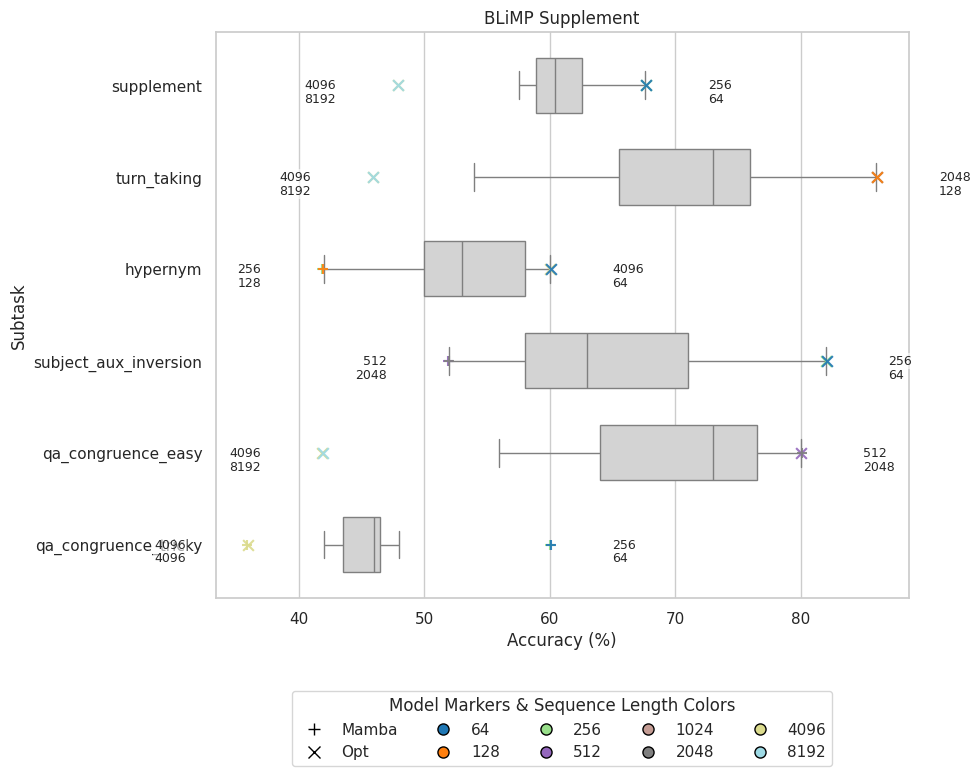

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap

def label_with_spacing(df_sub_sorted, y_pos, side="left", spacing=0.1):
    """
    Place seq_len labels on the left or right side of the plot for given subtask y position,
    ensuring minimum vertical spacing between labels.
    """
    if df_sub_sorted.empty:
        return

    x_vals = df_sub_sorted["score"].values
    if side == "left":
        x_pos = x_vals.min() - 5
        ha = "right"
    else:
        x_pos = x_vals.max() + 5
        ha = "left"

    label_y_positions = []
    for i in range(len(df_sub_sorted)):
        label_y_positions.append(y_pos + i * spacing)

    for i in range(1, len(label_y_positions)):
        if label_y_positions[i] - label_y_positions[i-1] < spacing:
            label_y_positions[i] = label_y_positions[i-1] + spacing

    for (_, row), label_y in zip(df_sub_sorted.iterrows(), label_y_positions):
        seq_len_label = str(row["seq_len"])
        plt.text(
            x_pos,
            label_y,
            seq_len_label,
            ha=ha,
            va="center",
            fontsize=9,
            bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1)
        )

sns.set(style="whitegrid")

unique_seq_lens = sorted(df["seq_len"].unique())
cmap = get_cmap("tab20", len(unique_seq_lens))
seq_len_to_color = {seq: cmap(i) for i, seq in enumerate(unique_seq_lens)}

model_to_marker = {
    "Mamba": "+",
    "Opt": "x"
}

for task_name in df["task"].unique():
    df_task = df[df["task"] == task_name]
    plt.figure(figsize=(10, 8))

    sns.boxplot(
        data=df_task,
        y="subtask",
        x="score",
        whis=1.5,
        width=0.6,
        fliersize=0,
        color='lightgray',
        orient='h'
    )

    for subtask in df_task["subtask"].unique():
        df_sub = df_task[df_task["subtask"] == subtask]
        y_pos = list(df_task["subtask"].unique()).index(subtask)

        # Sort scores ascending
        df_sorted = df_sub.sort_values("score")

        # Find min and max score (boxplot whisker proxies)
        min_score = df_sorted["score"].min()
        max_score = df_sorted["score"].max()

        # Plot 2 lowest points evenly spaced left of min_score
        low_points = df_sorted.head(2)
        left_spacing = 0.05  # spacing between points
        n_low = len(low_points)
        for i, (_, row) in enumerate(low_points.iterrows()):
            # positions: min_score - left_spacing * (n_low - i)
            x_pos = min_score - left_spacing * (n_low - i)
            plt.scatter(
                x_pos,
                y_pos,
                marker=model_to_marker.get(row["model"], "o"),
                color=seq_len_to_color.get(row["seq_len"], "gray"),
                edgecolor="black",
                s=60,
                alpha=0.9,
                zorder=3
            )

        # Plot 2 highest points evenly spaced right of max_score
        high_points = df_sorted.tail(2)
        n_high = len(high_points)
        right_spacing = 0.05
        for i, (_, row) in enumerate(high_points.iterrows()):
            # positions: max_score + right_spacing * (i + 1)
            x_pos = max_score + right_spacing * (i + 1)
            plt.scatter(
                x_pos,
                y_pos,
                marker=model_to_marker.get(row["model"], "o"),
                color=seq_len_to_color.get(row["seq_len"], "gray"),
                edgecolor="black",
                s=60,
                alpha=0.9,
                zorder=3
            )

        # Add seq_len labels left and right with spacing
        label_with_spacing(low_points, y_pos, side="left", spacing=0.15)
        label_with_spacing(high_points, y_pos, side="right", spacing=0.15)

    # Legends
    model_handles = [
        Line2D([0], [0], marker=marker, color='w', label=model,
               markerfacecolor='gray', markeredgecolor='black', markersize=8)
        for model, marker in model_to_marker.items()
    ]
    seq_len_handles = [
        Line2D([0], [0], marker='o', color='w', label=str(seq_len),
               markerfacecolor=color, markeredgecolor='black', markersize=8)
        for seq_len, color in seq_len_to_color.items()
    ]

    plt.legend(handles=model_handles + seq_len_handles,
               title="Model Markers & Sequence Length Colors",
               bbox_to_anchor=(0.5, -0.15),
               loc='upper center',
               ncol=5,
               frameon=True)

    task_title = pretty_task_names.get(task_name, task_name.replace("zero_shot_causal_", "").capitalize())
    task_filename = task_name.replace("zero_shot_causal_", "")
    plt.title(task_title)
    plt.xlabel("Accuracy (%)")
    plt.ylabel("Subtask")
    plt.tight_layout()
    save_path = f"{task_filename}_subtask_accuracy.png"
    plt.savefig(save_path, dpi=300)
    plt.show()

